In [1]:
import os
import cv2
import pandas as pd
from pathlib import Path
import torch
import numpy as np
import PIL
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import patches,patheffects
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
import json
import collections
from enum import IntEnum
from collections import defaultdict
import torch.nn.functional as F
import torchvision.models as models
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch.utils.data as utils
import torch.nn as nn
import torch.optim as optim
torch.cuda.set_device(0)

In [2]:
%pwd

'C:\\Users\\Srinjay\\Desktop\\VOCdevkit'

In [3]:
root_path="C://Users//Srinjay//Desktop//VOCdevkit/"

In [4]:
PATH = Path(root_path)
list(PATH.iterdir())

[WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/.ipynb_checkpoints'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/.tmp.drivedownload'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/attributesAndMethods.py'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/BE_PROJECT_InceptionV3.ipynb'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/chkpoint.pth.tar'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/Exercise-Classes-and-Objects.pdf'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/get.sh'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/imports.py'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/largest_anno_CSV'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/largest_anno_CSV_validation'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/model_best.pth.tar'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/notes'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/Pascal Object detection.ipynb'),
 WindowsPath('C:/Users/Srinjay/Desktop/VOCdevkit/pascal.ipynb'),


In [5]:
x=os.path.join(root_path,'PASCAL_VOC//pascal_train2007.json')
print (x)
print (type(x))

C://Users//Srinjay//Desktop//VOCdevkit/PASCAL_VOC//pascal_train2007.json
<class 'str'>


In [6]:
trn_j=open((os.path.join(root_path,'PASCAL_VOC//pascal_train2007.json'))).read()
train_j=json.loads(trn_j)
print (train_j.keys())
print (train_j.values)

dict_keys(['images', 'type', 'annotations', 'categories'])
<built-in method values of dict object at 0x000001EED58F9510>


In [7]:
tst_j=open(os.path.join(root_path,'PASCAL_VOC//pascal_test2007.json')).read()
test_j=json.loads(tst_j)
test_j.keys()

dict_keys(['images', 'type', 'annotations', 'categories'])

In [8]:
val_j=open(os.path.join(root_path,'PASCAL_VOC//pascal_val2007.json')).read()
val_j=json.loads(tst_j)
val_j.keys()

dict_keys(['images', 'type', 'annotations', 'categories'])

In [9]:
IMAGES,ANNOTATIONS,CATEGORIES,ID='images','annotations','categories','id'

In [131]:
train_j[IMAGES][:10]

[{'file_name': '000012.jpg', 'height': 333, 'width': 500, 'id': 12},
 {'file_name': '000017.jpg', 'height': 364, 'width': 480, 'id': 17},
 {'file_name': '000023.jpg', 'height': 500, 'width': 334, 'id': 23},
 {'file_name': '000026.jpg', 'height': 333, 'width': 500, 'id': 26},
 {'file_name': '000032.jpg', 'height': 281, 'width': 500, 'id': 32},
 {'file_name': '000033.jpg', 'height': 366, 'width': 500, 'id': 33},
 {'file_name': '000034.jpg', 'height': 500, 'width': 360, 'id': 34},
 {'file_name': '000035.jpg', 'height': 375, 'width': 500, 'id': 35},
 {'file_name': '000036.jpg', 'height': 500, 'width': 332, 'id': 36},
 {'file_name': '000042.jpg', 'height': 335, 'width': 500, 'id': 42}]

In [11]:
val_j[IMAGES][:10]

[{'file_name': '000001.jpg', 'height': 500, 'width': 353, 'id': 1},
 {'file_name': '000002.jpg', 'height': 500, 'width': 335, 'id': 2},
 {'file_name': '000003.jpg', 'height': 375, 'width': 500, 'id': 3},
 {'file_name': '000004.jpg', 'height': 406, 'width': 500, 'id': 4},
 {'file_name': '000006.jpg', 'height': 375, 'width': 500, 'id': 6},
 {'file_name': '000008.jpg', 'height': 375, 'width': 500, 'id': 8},
 {'file_name': '000010.jpg', 'height': 480, 'width': 354, 'id': 10},
 {'file_name': '000011.jpg', 'height': 324, 'width': 500, 'id': 11},
 {'file_name': '000013.jpg', 'height': 375, 'width': 500, 'id': 13},
 {'file_name': '000014.jpg', 'height': 333, 'width': 500, 'id': 14}]

In [12]:
val_j[ANNOTATIONS][:10]

[{'segmentation': [[47, 239, 47, 371, 195, 371, 195, 239]],
  'area': 19536,
  'iscrowd': 0,
  'image_id': 1,
  'bbox': [47, 239, 148, 132],
  'category_id': 12,
  'id': 1,
  'ignore': 0},
 {'segmentation': [[7, 11, 7, 498, 352, 498, 352, 11]],
  'area': 168015,
  'iscrowd': 0,
  'image_id': 1,
  'bbox': [7, 11, 345, 487],
  'category_id': 15,
  'id': 2,
  'ignore': 0},
 {'segmentation': [[138, 199, 138, 301, 207, 301, 207, 199]],
  'area': 7038,
  'iscrowd': 0,
  'image_id': 2,
  'bbox': [138, 199, 69, 102],
  'category_id': 19,
  'id': 3,
  'ignore': 0},
 {'segmentation': [[122, 154, 122, 195, 215, 195, 215, 154]],
  'area': 3813,
  'iscrowd': 0,
  'image_id': 3,
  'bbox': [122, 154, 93, 41],
  'category_id': 18,
  'id': 4,
  'ignore': 0},
 {'segmentation': [[238, 155, 238, 205, 307, 205, 307, 155]],
  'area': 3450,
  'iscrowd': 0,
  'image_id': 3,
  'bbox': [238, 155, 69, 50],
  'category_id': 9,
  'id': 5,
  'ignore': 0},
 {'segmentation': [[12, 310, 12, 362, 84, 362, 84, 310]],
  

In [13]:
train_j[ANNOTATIONS][:10]

[{'segmentation': [[155, 96, 155, 270, 351, 270, 351, 96]],
  'area': 34104,
  'iscrowd': 0,
  'image_id': 12,
  'bbox': [155, 96, 196, 174],
  'category_id': 7,
  'id': 1,
  'ignore': 0},
 {'segmentation': [[184, 61, 184, 199, 279, 199, 279, 61]],
  'area': 13110,
  'iscrowd': 0,
  'image_id': 17,
  'bbox': [184, 61, 95, 138],
  'category_id': 15,
  'id': 2,
  'ignore': 0},
 {'segmentation': [[89, 77, 89, 336, 403, 336, 403, 77]],
  'area': 81326,
  'iscrowd': 0,
  'image_id': 17,
  'bbox': [89, 77, 314, 259],
  'category_id': 13,
  'id': 3,
  'ignore': 0},
 {'segmentation': [[8, 229, 8, 500, 245, 500, 245, 229]],
  'area': 64227,
  'iscrowd': 0,
  'image_id': 23,
  'bbox': [8, 229, 237, 271],
  'category_id': 2,
  'id': 4,
  'ignore': 0},
 {'segmentation': [[229, 219, 229, 500, 334, 500, 334, 219]],
  'area': 29505,
  'iscrowd': 0,
  'image_id': 23,
  'bbox': [229, 219, 105, 281],
  'category_id': 2,
  'id': 5,
  'ignore': 0},
 {'segmentation': [[1, 177, 1, 500, 90, 500, 90, 177]],
 

In [14]:
7/224

0.03125

In [15]:
train_j[CATEGORIES][:40]

[{'supercategory': 'none', 'id': 1, 'name': 'aeroplane'},
 {'supercategory': 'none', 'id': 2, 'name': 'bicycle'},
 {'supercategory': 'none', 'id': 3, 'name': 'bird'},
 {'supercategory': 'none', 'id': 4, 'name': 'boat'},
 {'supercategory': 'none', 'id': 5, 'name': 'bottle'},
 {'supercategory': 'none', 'id': 6, 'name': 'bus'},
 {'supercategory': 'none', 'id': 7, 'name': 'car'},
 {'supercategory': 'none', 'id': 8, 'name': 'cat'},
 {'supercategory': 'none', 'id': 9, 'name': 'chair'},
 {'supercategory': 'none', 'id': 10, 'name': 'cow'},
 {'supercategory': 'none', 'id': 11, 'name': 'diningtable'},
 {'supercategory': 'none', 'id': 12, 'name': 'dog'},
 {'supercategory': 'none', 'id': 13, 'name': 'horse'},
 {'supercategory': 'none', 'id': 14, 'name': 'motorbike'},
 {'supercategory': 'none', 'id': 15, 'name': 'person'},
 {'supercategory': 'none', 'id': 16, 'name': 'pottedplant'},
 {'supercategory': 'none', 'id': 17, 'name': 'sheep'},
 {'supercategory': 'none', 'id': 18, 'name': 'sofa'},
 {'super

In [16]:
FILE_NAME,ID,IMG_ID,CAT_ID,BBOX = 'file_name','id','image_id','category_id','bbox'

In [17]:
#dict from id(not image_id) to the category in image
categories=dict((x[ID],x['name']) for x in train_j[CATEGORIES])
categories

{1: 'aeroplane',
 2: 'bicycle',
 3: 'bird',
 4: 'boat',
 5: 'bottle',
 6: 'bus',
 7: 'car',
 8: 'cat',
 9: 'chair',
 10: 'cow',
 11: 'diningtable',
 12: 'dog',
 13: 'horse',
 14: 'motorbike',
 15: 'person',
 16: 'pottedplant',
 17: 'sheep',
 18: 'sofa',
 19: 'train',
 20: 'tvmonitor'}

In [18]:
#dict from idd to the name of the file 
train_fns=dict((x[ID],x['file_name']) for x in train_j[IMAGES])
train_fns

{12: '000012.jpg',
 17: '000017.jpg',
 23: '000023.jpg',
 26: '000026.jpg',
 32: '000032.jpg',
 33: '000033.jpg',
 34: '000034.jpg',
 35: '000035.jpg',
 36: '000036.jpg',
 42: '000042.jpg',
 44: '000044.jpg',
 47: '000047.jpg',
 48: '000048.jpg',
 61: '000061.jpg',
 64: '000064.jpg',
 66: '000066.jpg',
 73: '000073.jpg',
 77: '000077.jpg',
 78: '000078.jpg',
 83: '000083.jpg',
 89: '000089.jpg',
 91: '000091.jpg',
 104: '000104.jpg',
 112: '000112.jpg',
 122: '000122.jpg',
 129: '000129.jpg',
 133: '000133.jpg',
 134: '000134.jpg',
 138: '000138.jpg',
 140: '000140.jpg',
 141: '000141.jpg',
 147: '000147.jpg',
 153: '000153.jpg',
 154: '000154.jpg',
 159: '000159.jpg',
 161: '000161.jpg',
 162: '000162.jpg',
 163: '000163.jpg',
 164: '000164.jpg',
 171: '000171.jpg',
 173: '000173.jpg',
 174: '000174.jpg',
 187: '000187.jpg',
 189: '000189.jpg',
 192: '000192.jpg',
 193: '000193.jpg',
 194: '000194.jpg',
 198: '000198.jpg',
 200: '000200.jpg',
 207: '000207.jpg',
 209: '000209.jpg',
 2

In [19]:
val_fns=dict((x[ID],x['file_name']) for x in val_j[IMAGES])
val_fns

{1: '000001.jpg',
 2: '000002.jpg',
 3: '000003.jpg',
 4: '000004.jpg',
 6: '000006.jpg',
 8: '000008.jpg',
 10: '000010.jpg',
 11: '000011.jpg',
 13: '000013.jpg',
 14: '000014.jpg',
 15: '000015.jpg',
 18: '000018.jpg',
 22: '000022.jpg',
 25: '000025.jpg',
 27: '000027.jpg',
 28: '000028.jpg',
 29: '000029.jpg',
 31: '000031.jpg',
 37: '000037.jpg',
 38: '000038.jpg',
 40: '000040.jpg',
 43: '000043.jpg',
 45: '000045.jpg',
 49: '000049.jpg',
 53: '000053.jpg',
 54: '000054.jpg',
 55: '000055.jpg',
 56: '000056.jpg',
 57: '000057.jpg',
 58: '000058.jpg',
 59: '000059.jpg',
 62: '000062.jpg',
 67: '000067.jpg',
 68: '000068.jpg',
 69: '000069.jpg',
 70: '000070.jpg',
 71: '000071.jpg',
 74: '000074.jpg',
 75: '000075.jpg',
 76: '000076.jpg',
 79: '000079.jpg',
 80: '000080.jpg',
 82: '000082.jpg',
 84: '000084.jpg',
 85: '000085.jpg',
 86: '000086.jpg',
 87: '000087.jpg',
 88: '000088.jpg',
 90: '000090.jpg',
 92: '000092.jpg',
 94: '000094.jpg',
 96: '000096.jpg',
 97: '000097.jpg',

In [20]:
#all the train_ids images
train_ids=[x[ID] for x in train_j[IMAGES]]
train_ids

[12,
 17,
 23,
 26,
 32,
 33,
 34,
 35,
 36,
 42,
 44,
 47,
 48,
 61,
 64,
 66,
 73,
 77,
 78,
 83,
 89,
 91,
 104,
 112,
 122,
 129,
 133,
 134,
 138,
 140,
 141,
 147,
 153,
 154,
 159,
 161,
 162,
 163,
 164,
 171,
 173,
 174,
 187,
 189,
 192,
 193,
 194,
 198,
 200,
 207,
 209,
 219,
 220,
 222,
 225,
 228,
 235,
 242,
 250,
 256,
 259,
 262,
 263,
 276,
 278,
 282,
 288,
 294,
 296,
 306,
 307,
 311,
 312,
 317,
 320,
 325,
 331,
 334,
 337,
 344,
 347,
 349,
 355,
 359,
 367,
 370,
 372,
 379,
 382,
 387,
 391,
 394,
 395,
 400,
 404,
 406,
 407,
 411,
 416,
 430,
 431,
 438,
 446,
 450,
 454,
 463,
 468,
 469,
 470,
 474,
 476,
 477,
 484,
 489,
 496,
 503,
 508,
 516,
 518,
 519,
 522,
 524,
 525,
 526,
 528,
 535,
 537,
 541,
 544,
 549,
 550,
 552,
 554,
 555,
 559,
 565,
 577,
 583,
 589,
 590,
 592,
 597,
 605,
 609,
 612,
 620,
 622,
 625,
 632,
 633,
 635,
 648,
 654,
 657,
 671,
 672,
 680,
 685,
 688,
 689,
 695,
 699,
 700,
 709,
 710,
 711,
 726,
 729,
 731,
 733,
 7

In [21]:
val_ids=[x[ID] for x in val_j[IMAGES]]
val_ids

[1,
 2,
 3,
 4,
 6,
 8,
 10,
 11,
 13,
 14,
 15,
 18,
 22,
 25,
 27,
 28,
 29,
 31,
 37,
 38,
 40,
 43,
 45,
 49,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 62,
 67,
 68,
 69,
 70,
 71,
 74,
 75,
 76,
 79,
 80,
 82,
 84,
 85,
 86,
 87,
 88,
 90,
 92,
 94,
 96,
 97,
 98,
 100,
 103,
 105,
 106,
 108,
 111,
 114,
 115,
 116,
 119,
 124,
 126,
 127,
 128,
 135,
 136,
 137,
 139,
 144,
 145,
 148,
 149,
 151,
 152,
 155,
 157,
 160,
 166,
 167,
 168,
 172,
 175,
 176,
 178,
 179,
 181,
 182,
 183,
 185,
 186,
 188,
 191,
 195,
 196,
 197,
 199,
 201,
 202,
 204,
 205,
 206,
 212,
 213,
 216,
 217,
 223,
 226,
 227,
 230,
 231,
 234,
 237,
 238,
 239,
 240,
 243,
 247,
 248,
 252,
 253,
 254,
 255,
 258,
 260,
 261,
 264,
 265,
 267,
 271,
 272,
 273,
 274,
 277,
 279,
 280,
 281,
 283,
 284,
 286,
 287,
 290,
 291,
 292,
 293,
 295,
 297,
 299,
 300,
 301,
 309,
 310,
 313,
 314,
 315,
 316,
 319,
 324,
 326,
 327,
 330,
 333,
 335,
 339,
 341,
 342,
 345,
 346,
 348,
 350,
 351,
 353,
 356,
 357

In [22]:
main_path='C:\\Users\\Srinjay\\Desktop\\VOCdevkit\\VOC2007'
for x in os.listdir(main_path):
    print (os.path.join(main_path,x))
#print (os.path.join(images_path,x) for x in os.listdir(images_path))
#print (x[0] for x in os.walk(images_path))

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\Annotations
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\ImageSets
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\SegmentationClass
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\SegmentationObject
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\val_JPEGImages


In [23]:
#printing all the names of images
images='C:\\Users\\Srinjay\\Desktop\\VOCdevkit\\VOC2007\\JPEGImages'
for x in os.listdir(images):
    print (os.path.join(images,x))

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000005.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000007.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000009.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000012.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000016.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000017.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000019.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000020.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000021.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000023.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000024.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000026.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000030.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000032.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000033.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000515.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000516.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000518.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000519.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000520.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000522.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000523.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000524.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000525.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000526.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000528.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000530.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000531.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000535.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\000537.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001012.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001014.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001015.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001017.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001018.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001024.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001027.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001028.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001036.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001041.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001042.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001043.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001045.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001050.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001052.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001522.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001523.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001524.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001526.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001528.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001529.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001531.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001532.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001536.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001537.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001539.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001541.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001543.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001544.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\001545.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002043.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002045.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002047.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002049.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002051.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002054.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002055.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002056.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002058.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002061.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002063.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002064.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002067.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002068.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002069.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002513.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002514.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002518.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002519.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002520.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002523.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002524.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002525.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002529.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002533.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002534.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002537.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002539.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002540.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\002542.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003009.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003011.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003013.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003015.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003017.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003021.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003023.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003024.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003027.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003028.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003031.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003032.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003034.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003038.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003039.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003499.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003500.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003506.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003508.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003509.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003510.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003511.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003516.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003518.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003519.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003521.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003522.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003524.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003525.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003528.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003996.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003997.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\003998.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004003.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004005.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004008.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004009.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004010.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004011.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004012.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004013.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004014.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004015.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004016.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004017.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004519.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004520.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004524.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004526.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004527.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004528.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004530.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004532.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004535.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004537.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004539.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004540.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004542.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004544.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\004548.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005029.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005032.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005033.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005036.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005037.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005039.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005042.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005045.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005047.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005052.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005054.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005055.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005056.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005057.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005058.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005522.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005524.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005526.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005527.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005530.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005531.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005535.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005536.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005539.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005541.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005542.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005544.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005547.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005549.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\005550.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006020.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006023.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006025.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006026.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006027.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006028.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006029.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006030.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006033.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006035.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006038.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006041.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006042.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006043.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006045.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006499.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006501.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006503.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006506.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006507.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006509.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006512.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006515.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006519.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006520.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006523.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006524.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006529.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006530.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006532.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006994.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\006995.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007002.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007003.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007004.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007006.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007007.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007008.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007009.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007011.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007016.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007018.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007020.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007021.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007022.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007491.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007493.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007497.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007498.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007503.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007506.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007511.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007513.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007517.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007519.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007521.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007523.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007524.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007525.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\007526.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008004.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008005.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008008.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008009.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008012.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008017.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008019.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008023.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008024.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008026.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008029.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008031.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008032.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008033.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008036.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008521.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008522.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008523.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008524.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008526.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008529.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008530.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008533.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008534.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008535.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008536.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008541.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008542.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008549.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\008550.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009039.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009042.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009045.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009048.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009049.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009051.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009053.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009058.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009059.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009060.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009063.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009064.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009066.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009068.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009072.jpg
C:\Users\Srinjay\Desktop\

C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009526.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009527.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009528.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009531.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009532.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009533.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009537.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009540.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009541.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009542.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009543.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009545.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009546.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009549.jpg
C:\Users\Srinjay\Desktop\VOCdevkit\VOC2007\JPEGImages\009550.jpg
C:\Users\Srinjay\Desktop\

In [24]:
im0_d=train_j[IMAGES][0]
print (im0_d[FILE_NAME])
print (im0_d[ID])
#print (categories[12])

000012.jpg
12


In [25]:
#dicts
#1.dict from id to the category in image
#2.
#3.

In [26]:
#bounding box is in the form of x,y height ,width 
#switched the x and y coordinates
#computer vision is in cols * rows,so invert it
#define it in form of x,y left upper and x,y bottom right
#converting bounding box into height_width
#1 pixel is added and subtracted beacuse without it it goes beyond the bounds of the object 
def hw_bb(bb):
    return np.array([bb[1],bb[0],bb[3]+bb[1]-1, bb[2]+bb[0]-1])
def bb_hw(a): 
    return np.array([a[1],a[0],a[3]-a[1]+1,a[2]-a[0]+1])

In [27]:
#image id -> (bbox,category_id)
train_anno=collections.defaultdict(lambda:[])
for i in train_j[ANNOTATIONS]:
    bb=i[BBOX]
    bb=hw_bb(bb)
    train_anno[i[IMG_ID]].append((bb,i[CAT_ID]))

In [28]:
val_anno=collections.defaultdict(lambda:[])
for i in val_j[ANNOTATIONS]:
    bb=i[BBOX]
    bb=hw_bb(bb)
    val_anno[i[IMG_ID]].append((bb,i[CAT_ID]))

In [29]:
print (train_anno.keys())
train_anno
#train_anno=np.array(train_anno)

dict_keys([12, 17, 23, 26, 32, 33, 34, 35, 36, 42, 44, 47, 48, 61, 64, 66, 73, 77, 78, 83, 89, 91, 104, 112, 122, 129, 133, 134, 138, 140, 141, 147, 153, 154, 159, 161, 162, 163, 164, 171, 173, 174, 187, 189, 192, 193, 194, 198, 200, 207, 209, 219, 220, 222, 225, 228, 235, 242, 250, 256, 259, 262, 263, 276, 278, 282, 288, 294, 296, 306, 307, 311, 312, 317, 320, 325, 331, 334, 337, 344, 347, 349, 355, 359, 367, 370, 372, 379, 382, 387, 391, 394, 395, 400, 404, 406, 407, 411, 416, 430, 431, 438, 446, 450, 454, 463, 468, 469, 470, 474, 476, 477, 484, 489, 496, 503, 508, 516, 518, 519, 522, 524, 525, 526, 528, 535, 537, 541, 544, 549, 550, 552, 554, 555, 559, 565, 577, 583, 589, 590, 592, 597, 605, 609, 612, 620, 622, 625, 632, 633, 635, 648, 654, 657, 671, 672, 680, 685, 688, 689, 695, 699, 700, 709, 710, 711, 726, 729, 731, 733, 739, 740, 753, 754, 761, 764, 767, 768, 770, 774, 793, 796, 804, 805, 810, 812, 818, 820, 822, 823, 827, 828, 829, 830, 845, 849, 850, 851, 859, 860, 865, 867, 8

defaultdict(<function __main__.<lambda>()>,
            {12: [(array([ 96, 155, 269, 350]), 7)],
             17: [(array([ 61, 184, 198, 278]), 15),
              (array([ 77,  89, 335, 402]), 13)],
             23: [(array([229,   8, 499, 244]), 2),
              (array([219, 229, 499, 333]), 2),
              (array([177,   1, 499,  89]), 2),
              (array([  0,   1, 368, 116]), 15),
              (array([  1,   2, 461, 242]), 15),
              (array([  0, 224, 485, 333]), 15)],
             26: [(array([124,  89, 211, 336]), 7)],
             32: [(array([ 77, 103, 182, 374]), 1),
              (array([ 87, 132, 122, 196]), 1),
              (array([179, 194, 228, 212]), 15),
              (array([188,  25, 237,  43]), 15)],
             33: [(array([106,   8, 262, 498]), 1),
              (array([199, 420, 225, 481]), 1),
              (array([187, 324, 222, 410]), 1)],
             34: [(array([166, 115, 399, 359]), 19),
              (array([152, 140, 228, 332]), 19)],


In [30]:
val_anno

defaultdict(<function __main__.<lambda>()>,
            {1: [(array([239,  47, 370, 194]), 12),
              (array([ 11,   7, 497, 351]), 15)],
             2: [(array([199, 138, 300, 206]), 19)],
             3: [(array([154, 122, 194, 214]), 18),
              (array([155, 238, 204, 306]), 9)],
             4: [(array([310,  12, 361,  83]), 7),
              (array([329, 361, 388, 499]), 7),
              (array([327, 234, 374, 333]), 7),
              (array([326, 174, 363, 251]), 7),
              (array([319, 138, 358, 188]), 7),
              (array([324, 107, 352, 149]), 7),
              (array([322,  83, 349, 120]), 7)],
             6: [(array([134, 186, 241, 281]), 16),
              (array([208, 153, 374, 368]), 11),
              (array([206, 254, 374, 365]), 9),
              (array([194, 297, 246, 331]), 9),
              (array([189, 278, 230, 307]), 9),
              (array([191, 136, 198, 150]), 9),
              (array([197, 136, 211, 155]), 9),
              (arra

In [31]:
im_a = train_anno[im0_d[ID]]; im_a

[(array([ 96, 155, 269, 350]), 7)]

In [32]:
im0_a = im_a[0]; im0_a

(array([ 96, 155, 269, 350]), 7)

In [33]:
print (im0_d[ID])
im_a=train_anno[im0_d[ID]]
print (im_a)
im0_a = im_a[0]
print (im0_a)
print (categories[7])

12
[(array([ 96, 155, 269, 350]), 7)]
(array([ 96, 155, 269, 350]), 7)
car


In [34]:
train_anno[17]

[(array([ 61, 184, 198, 278]), 15), (array([ 77,  89, 335, 402]), 13)]

In [35]:
images_path='C:\\Users\\Srinjay\\Desktop\\VOCdevkit\\VOC2007\\JPEGImages'
def open_image(img_file):
    path=os.path.join(images_path,img_file)#im0_d[FILE_NAME])
    flags=cv2.IMREAD_UNCHANGED + cv2.IMREAD_ANYDEPTH + cv2.IMREAD_ANYCOLOR
    im=cv2.imread(path,flags).astype(np.float32)
    im=im/255
    im=cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
    return (im) 

In [36]:
val_images_path='C:\\Users\\Srinjay\\Desktop\\VOCdevkit\\VOC2007\\val_JPEGImages'
def open_val_img(img_file):
    path=os.path.join(val_images_path,img_file)
    flags=cv2.IMREAD_UNCHANGED + cv2.IMREAD_ANYDEPTH + cv2.IMREAD_ANYCOLOR
    im=cv2.imread(path,flags).astype(np.float32)
    im/=255
    im=cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
    return(im)

In [37]:
def show_img(im, figsize=None, ax=None):
    fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    return ax

In [38]:
def show_image(img,figsize=None,ax=None):
    fig,ax=plt.subplots(figsize=figsize)
    ax.imshow(img)
    ax.get_xaxis().set_visible(True)
    ax.get_yaxis().set_visible(True)
    return (ax)

In [39]:
def draw_outline(o, lw=4):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

In [40]:
#read docs (patches.rectangle requires left(b[:2]) and right co-ordinates in tuples,(*b[-2:]) )
def draw_rect(ax, b):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor='white', lw=2))
    draw_outline(patch, 4)

In [41]:
#read docs (ax.text requires position of the text,then the string)
def draw_text(ax, xy, txt, sz=14):
    text = ax.text(*xy, txt,
        verticalalignment='top', color='white', fontsize=sz, weight='bold')
    draw_outline(text, 1)

In [42]:
im=open_image(im0_d[FILE_NAME])
print (im0_d[FILE_NAME])
print (type(im))
print (im.dtype)

000012.jpg
<class 'numpy.ndarray'>
float32


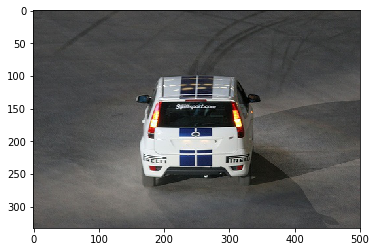

In [43]:
u=show_image(im)

In [44]:
155/224,96/224,196/224,174/224

(0.6919642857142857, 0.42857142857142855, 0.875, 0.7767857142857143)

In [45]:
bb_hw(im0_a[0])

array([155,  96, 196, 174])

[155  96 196 174]
[196 174]


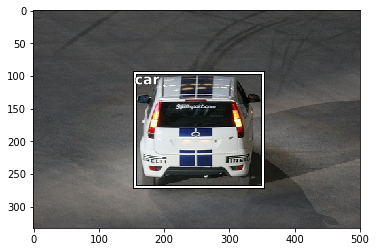

In [46]:
ax = show_image(im)
b = bb_hw(im0_a[0])
print (b)
print (b[-2:])
draw_rect(ax, b)
draw_text(ax, b[:2], categories[im0_a[1]])

In [47]:
def draw_image(im,ann):
    ax=show_img(im,figsize=(16,8))
    for b,c in ann:
        b=bb_hw(b)
        draw_rect(ax, b)
        draw_text(ax, b[:2], categories[c], sz=16)

In [48]:
def draw_idx(i):
    im_a = train_anno[i]
    print (im_a)
    im = open_image(train_fns[i])
    print(im.shape)
    draw_image(im, im_a)

In [49]:
train_anno[91]

[(array([240, 124, 283, 194]), 7),
 (array([247,  80, 267, 104]), 7),
 (array([249,  90, 273, 125]), 7)]

[(array([124,  89, 211, 336]), 7)]
(333, 500, 3)


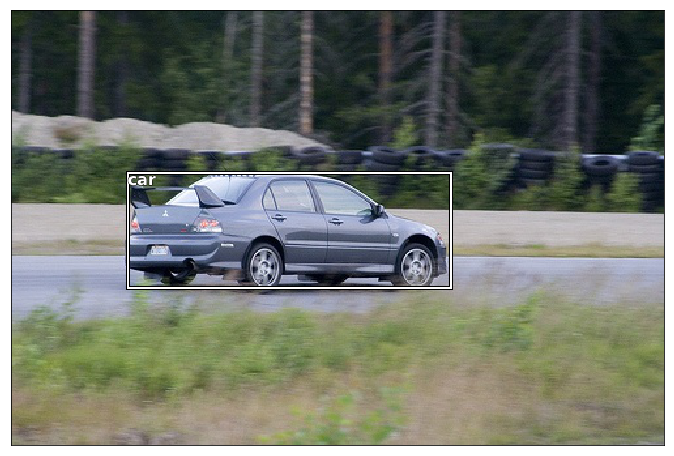

In [50]:
draw_idx(26)

<h3>Largest item classifier</h3>
<h3>X=>image,y=>class of largest class</h3>
<h3>prediction:class of largest object</h3>
<h3>loss function=>cross-entropy</h3>

In [51]:
one_class=collections.defaultdict(lambda:[])
mul_class=collections.defaultdict(lambda:[])
mul_class_list=[]
for x,y in train_anno.items():
    print (x,y)
    print (len(y))
    if len(y) > 1:
        mul_class[x].append(y)
        mul_class_list.append(y)
    else:
        one_class[x].append(y)

12 [(array([ 96, 155, 269, 350]), 7)]
1
17 [(array([ 61, 184, 198, 278]), 15), (array([ 77,  89, 335, 402]), 13)]
2
23 [(array([229,   8, 499, 244]), 2), (array([219, 229, 499, 333]), 2), (array([177,   1, 499,  89]), 2), (array([  0,   1, 368, 116]), 15), (array([  1,   2, 461, 242]), 15), (array([  0, 224, 485, 333]), 15)]
6
26 [(array([124,  89, 211, 336]), 7)]
1
32 [(array([ 77, 103, 182, 374]), 1), (array([ 87, 132, 122, 196]), 1), (array([179, 194, 228, 212]), 15), (array([188,  25, 237,  43]), 15)]
4
33 [(array([106,   8, 262, 498]), 1), (array([199, 420, 225, 481]), 1), (array([187, 324, 222, 410]), 1)]
3
34 [(array([166, 115, 399, 359]), 19), (array([152, 140, 228, 332]), 19)]
2
35 [(array([ 95,   0, 360, 190]), 15), (array([ 97, 217, 317, 464]), 15), (array([194, 467, 316, 499]), 15), (array([303,   2, 374, 499]), 11)]
4
36 [(array([ 78,  26, 343, 318]), 12)]
1
42 [(array([ 31, 262, 294, 499]), 19), (array([ 35,   0, 298, 234]), 19)]
2
44 [(array([  0,   0, 329, 369]), 9), (a

612 [(array([143, 157, 499, 374]), 15), (array([109,   0, 499, 194]), 15), (array([  0,   0, 212, 373]), 19)]
3
620 [(array([181, 113, 308, 302]), 7), (array([266,  50, 279,  70]), 7), (array([271,  18, 283,  35]), 7)]
3
622 [(array([ 86, 155, 338, 400]), 10)]
1
625 [(array([276, 371, 336, 462]), 9), (array([214, 371, 287, 467]), 9), (array([213, 477, 277, 498]), 9), (array([273, 475, 333, 499]), 9), (array([208, 262, 280, 287]), 9), (array([275, 261, 330, 287]), 9), (array([204, 153, 273, 186]), 9), (array([269, 153, 325, 186]), 9), (array([205,  64, 276,  99]), 9), (array([268,  67, 327,  85]), 9), (array([23, 57, 85, 85]), 9), (array([ 78,  51, 157,  85]), 9), (array([ 25, 162,  92, 198]), 9), (array([ 82, 161, 151, 193]), 9), (array([ 25, 273,  91, 299]), 9), (array([ 87, 272, 165, 306]), 9), (array([ 25, 374,  91, 399]), 9), (array([ 84, 373, 152, 397]), 9), (array([ 26, 481,  87, 499]), 9), (array([ 84, 479, 154, 499]), 9), (array([208, 394, 293, 485]), 15), (array([213, 270, 290

1171 [(array([222, 155, 330, 321]), 14), (array([ 58,   3, 242,  65]), 15), (array([ 84, 143, 250, 228]), 15), (array([ 65, 289, 330, 478]), 15)]
4
1172 [(array([ 19,  18, 161, 485]), 19)]
1
1174 [(array([272,   0, 374, 249]), 18), (array([202, 314, 313, 379]), 9), (array([212, 245, 329, 318]), 9), (array([201, 142, 292, 186]), 9), (array([207, 184, 324, 372]), 11)]
5
1182 [(array([148, 124, 293, 402]), 10), (array([123,  99, 182, 217]), 10)]
2
1191 [(array([  2,   0, 374, 297]), 17)]
1
1194 [(array([179,  71, 339, 280]), 2)]
1
1204 [(array([191,  80, 372, 474]), 18), (array([142, 485, 200, 499]), 20), (array([191, 455, 265, 499]), 9)]
3
1205 [(array([ 75,  87, 262, 313]), 4)]
1
1207 [(array([ 76, 124, 374, 499]), 3)]
1
1209 [(array([ 95, 195, 237, 272]), 12)]
1
1212 [(array([165, 106, 328, 298]), 15), (array([ 24, 206, 158, 354]), 15), (array([ 66, 276, 225, 356]), 15), (array([ 77, 374, 369, 499]), 15), (array([ 27, 400, 124, 466]), 16), (array([ 56, 375, 128, 429]), 16), (array([  2

1733 [(array([269,   0, 328,  81]), 17), (array([274, 235, 325, 293]), 17), (array([274, 179, 364, 234]), 17), (array([260, 131, 286, 166]), 17), (array([251, 103, 268, 115]), 17), (array([253,  55, 274,  81]), 17), (array([262,  22, 273,  41]), 17), (array([253,   7, 270,  24]), 17), (array([255,  29, 268,  44]), 17), (array([255, 202, 266, 214]), 17), (array([259, 164, 280, 182]), 17), (array([258, 216, 265, 230]), 17), (array([263, 254, 277, 269]), 17), (array([265, 269, 275, 286]), 17), (array([263, 360, 275, 375]), 17), (array([261, 337, 271, 350]), 17), (array([261, 323, 273, 341]), 17), (array([259, 311, 273, 322]), 17), (array([258, 296, 273, 311]), 17)]
19
1734 [(array([ 83,  99, 312, 440]), 17)]
1
1738 [(array([ 67, 124, 299, 322]), 12)]
1
1739 [(array([177, 148, 316, 213]), 3)]
1
1741 [(array([110,   0, 250, 114]), 10), (array([132, 331, 155, 374]), 10)]
2
1750 [(array([ 70, 249, 133, 334]), 17), (array([ 87, 173, 156, 251]), 17), (array([ 30, 106,  99, 154]), 17), (array([ 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2647 [(array([173, 220, 211, 305]), 7)]
1
2648 [(array([156, 103, 371, 301]), 17), (array([147, 238, 224, 349]), 17), (array([ 99,  37, 266, 254]), 17)]
3
2653 [(array([ 11,   1, 374, 455]), 4)]
1
2662 [(array([169, 119, 377, 490]), 11), (array([ 41, 372, 292, 499]), 15), (array([219, 460, 377, 499]), 15), (array([ 13, 211, 173, 326]), 15), (array([ 33, 141, 171, 209]), 15), (array([ 54,  91, 169, 155]), 15), (array([ 52,   4, 367, 226]), 15)]
7
2664 [(array([179,  98, 217, 145]), 3), (array([107, 148, 172, 268]), 3), (array([174, 318, 213, 365]), 3), (array([218, 460, 265, 499]), 3), (array([180, 240, 217, 273]), 3), (array([168, 173, 202, 205]), 3), (array([174, 185, 216, 261]), 3)]
7
2666 [(array([173,   2, 447, 298]), 14), (array([231, 293, 350, 333]), 7)]
2
2669 [(array([136, 291, 173, 371]), 10), (array([190, 115, 286, 244]), 10), (array([240, 441, 293, 477]), 15), (array([183, 162, 268, 272]), 10)]
4
2680 [(array([ 35,   3, 333, 499]), 12)]
1
2682 [(array([150, 167, 278, 329]),

3185 [(array([168, 230, 278, 315]), 15), (array([169, 311, 286, 418]), 15), (array([321, 336, 374, 458]), 9), (array([337,  11, 374,  92]), 9), (array([209, 431, 365, 481]), 5), (array([212, 389, 292, 414]), 5), (array([ 72, 104, 374, 230]), 15), (array([ 65,  34, 374, 117]), 15)]
8
3188 [(array([124,  53, 374, 319]), 2), (array([  3, 256, 374, 434]), 15)]
2
3202 [(array([127, 263, 208, 359]), 11), (array([118, 333, 205, 397]), 9), (array([138, 171, 274, 294]), 9), (array([116,  25, 250, 126]), 16), (array([241, 422, 374, 499]), 16)]
5
3204 [(array([194, 171, 298, 277]), 20)]
1
3205 [(array([ 75,  27, 375, 305]), 15), (array([167,  10, 446, 321]), 9)]
2
3211 [(array([121, 305, 365, 426]), 16), (array([172, 333, 297, 373]), 16), (array([194, 205, 286, 245]), 16)]
3
3214 [(array([142, 229, 219, 495]), 7), (array([150, 205, 215, 344]), 7), (array([160, 166, 210, 251]), 7), (array([162, 136, 209, 212]), 7), (array([163, 105, 209, 183]), 7), (array([166,  82, 207, 155]), 7), (array([179,  6

3713 [(array([229, 175, 275, 227]), 7), (array([232, 155, 249, 173]), 7), (array([216,   1, 343,  74]), 7), (array([233, 282, 254, 323]), 7), (array([220, 371, 286, 495]), 7), (array([215, 314, 254, 369]), 7), (array([233, 247, 247, 266]), 7), (array([203,  79, 270, 139]), 7)]
8
3714 [(array([168, 176, 288, 297]), 17)]
1
3732 [(array([202,   1, 453,  56]), 15), (array([216,  20, 498, 127]), 15), (array([  0,  66, 499, 374]), 13)]
3
3735 [(array([ 32, 153, 192, 253]), 15), (array([ 88, 409, 199, 472]), 15), (array([ 77,  74, 329, 404]), 13), (array([128, 381, 269, 479]), 13)]
4
3740 [(array([159, 203, 328, 263]), 15), (array([140, 350, 314, 411]), 15), (array([155,   6, 352,  98]), 15), (array([238, 182, 274, 203]), 12)]
4
3743 [(array([144,  83, 272, 291]), 18), (array([162,   0, 279,  62]), 18)]
2
3748 [(array([173, 261, 319, 414]), 3)]
1
3749 [(array([ 56, 169, 374, 499]), 15)]
1
3751 [(array([189,   1, 333, 139]), 18), (array([226,  70, 250, 104]), 8), (array([170, 114, 246, 211]), 

4283 [(array([  0, 152, 498, 374]), 14)]
1
4287 [(array([  0,   1, 399, 499]), 15), (array([ 80,  74, 399, 375]), 8)]
2
4291 [(array([319, 272, 499, 349]), 5), (array([  0,   2, 499, 373]), 15)]
2
4292 [(array([157,   9, 411, 182]), 16), (array([ 31, 155, 376, 270]), 15)]
2
4296 [(array([234,  33, 499, 321]), 11), (array([ 64, 113, 235, 314]), 11), (array([  1, 160,  92, 309]), 11), (array([ 25, 227,  56, 245]), 5), (array([102, 187, 170, 219]), 5), (array([  1,  81,  97, 162]), 15), (array([ 37,  44, 150, 147]), 15), (array([ 85,  48, 219, 148]), 15), (array([179,   0, 383, 143]), 15), (array([383,   2, 496,  67]), 15), (array([  2, 254, 123, 352]), 15), (array([ 23, 315, 259, 374]), 15), (array([122, 314, 374, 374]), 15)]
13
4300 [(array([200,  78, 316, 234]), 14)]
1
4303 [(array([  2,   0, 280, 304]), 6), (array([128, 409, 153, 481]), 7), (array([129, 294, 168, 409]), 7), (array([126, 388, 144, 434]), 7), (array([123, 350, 137, 379]), 7)]
5
4307 [(array([ 86, 170, 261, 453]), 13), (

4879 [(array([157, 261, 201, 331]), 2), (array([135, 268, 191, 308]), 15), (array([130, 173, 188, 196]), 15)]
3
4882 [(array([141,  92, 273, 183]), 14), (array([ 68, 196, 329, 445]), 14), (array([125, 152, 332, 311]), 15)]
3
4885 [(array([137, 103, 339, 411]), 4)]
1
4897 [(array([195, 180, 332, 241]), 15), (array([187,   0, 311,  27]), 15), (array([211, 242, 332, 278]), 15)]
3
4898 [(array([ 16, 145, 302, 251]), 15), (array([158,  92, 290, 159]), 15), (array([172, 272, 212, 306]), 16), (array([196, 382, 261, 428]), 16)]
4
4902 [(array([140,   0, 373, 191]), 13), (array([123,  78, 363, 264]), 13), (array([117, 216, 374, 388]), 15), (array([ 67, 194, 374, 499]), 15)]
4
4905 [(array([  7,   1, 279, 196]), 1)]
1
4907 [(array([  0, 176, 328, 439]), 8)]
1
4910 [(array([181,  21, 393, 305]), 6)]
1
4911 [(array([119,   0, 240,  98]), 19), (array([ 36,  69, 342, 395]), 19)]
2
4913 [(array([ 96, 273, 334, 322]), 15), (array([125, 216, 339, 334]), 15), (array([177, 132, 357, 226]), 15), (array([ 

5414 [(array([104,  58, 332, 216]), 14), (array([120, 264, 332, 442]), 14), (array([ 39, 195, 329, 289]), 15), (array([ 54, 282, 329, 432]), 15), (array([ 94, 431, 149, 486]), 14)]
5
5417 [(array([  0,   0, 372, 383]), 15)]
1
5420 [(array([ 21,  31, 463, 394]), 4)]
1
5424 [(array([ 79,  38, 209, 152]), 2), (array([252,  23, 428, 149]), 2), (array([ 13,  69, 184, 180]), 15), (array([136,  20, 364, 208]), 15)]
4
5433 [(array([155, 138, 279, 331]), 12), (array([  0,   0, 374, 499]), 18)]
2
5440 [(array([175,   0, 242, 443]), 19)]
1
5445 [(array([232,  31, 496, 352]), 8)]
1
5448 [(array([ 57,   0, 179,  99]), 6), (array([112, 404, 205, 460]), 15), (array([113, 290, 217, 354]), 15), (array([121, 217, 200, 271]), 15), (array([116, 153, 181, 206]), 15), (array([114, 100, 192, 145]), 15), (array([108,  36, 186,  90]), 15), (array([149, 395, 218, 466]), 14), (array([146, 283, 218, 352]), 14), (array([149, 217, 215, 278]), 14), (array([151, 152, 211, 212]), 14), (array([143,  95, 207, 159]), 14)

5938 [(array([167, 372, 230, 397]), 9), (array([184, 420, 264, 454]), 9), (array([ 72, 134, 312, 400]), 15), (array([101,   2, 311, 151]), 15), (array([115, 147, 220, 223]), 15), (array([126,   7, 174,  52]), 15)]
6
5947 [(array([ 25,  89, 329, 322]), 17)]
1
5948 [(array([197, 165, 229, 228]), 12), (array([133, 259, 260, 324]), 13), (array([132, 328, 256, 423]), 13), (array([ 99, 365, 202, 402]), 15), (array([107, 273, 213, 309]), 15)]
5
5951 [(array([ 61, 184, 300, 497]), 14), (array([ 35, 328, 271, 467]), 15)]
2
5960 [(array([283,  93, 369, 165]), 8)]
1
5961 [(array([390,  57, 484, 293]), 6), (array([430, 305, 477, 323]), 15), (array([425, 332, 476, 350]), 15), (array([418, 359, 471, 374]), 15), (array([420, 114, 499, 165]), 15), (array([424,   0, 499,  24]), 15), (array([456,  24, 499,  74]), 15)]
7
5964 [(array([  0,   0, 330, 425]), 17)]
1
5971 [(array([108,   7, 332, 340]), 15)]
1
5980 [(array([  7,  52, 311, 419]), 8)]
1
5983 [(array([ 92, 234, 159, 285]), 3)]
1
5984 [(array([19

6523 [(array([185, 188, 229, 311]), 1)]
1
6524 [(array([  1, 277,  94, 494]), 7), (array([  2, 124,  90, 301]), 7), (array([  0,   0,  93, 137]), 7)]
3
6536 [(array([193,  27, 499, 333]), 15)]
1
6547 [(array([ 96,  22, 499, 272]), 8)]
1
6548 [(array([209, 173, 370, 473]), 3), (array([138, 298, 220, 355]), 3), (array([161, 443, 221, 499]), 3), (array([115, 187, 198, 255]), 3), (array([139, 143, 187, 172]), 3), (array([131,   0, 249,  92]), 3)]
6
6549 [(array([ 19, 175,  67, 246]), 4)]
1
6550 [(array([179,  43, 329, 288]), 14), (array([140, 289, 321, 354]), 15), (array([113, 206, 222, 282]), 15), (array([149, 337, 315, 378]), 15), (array([195,  11, 304,  60]), 2), (array([194, 432, 258, 490]), 2), (array([272, 459, 301, 479]), 15)]
7
6551 [(array([197, 259, 310, 361]), 2), (array([182, 225, 272, 318]), 2), (array([180, 103, 286, 215]), 2), (array([109, 106, 268, 198]), 15), (array([125, 226, 206, 285]), 15), (array([124, 260, 268, 354]), 15), (array([ 95,   4, 147,  31]), 15), (array([ 9

7093 [(array([ 73,  75, 298, 322]), 15), (array([183,  69, 374, 234]), 9), (array([178, 283, 374, 444]), 9)]
3
7095 [(array([129, 225, 289, 436]), 6)]
1
7105 [(array([152,   4, 332, 499]), 18)]
1
7108 [(array([188, 413, 287, 499]), 2), (array([175, 256, 264, 370]), 2), (array([178, 283, 262, 400]), 2), (array([168, 159, 256, 260]), 2), (array([154, 135, 221, 220]), 2), (array([136,  60, 224, 149]), 2), (array([121,   1, 187,  51]), 2), (array([ 78,   0, 161,  49]), 15), (array([ 93,  80, 200, 148]), 15), (array([110, 149, 189, 201]), 15), (array([123, 188, 231, 258]), 15), (array([132, 281, 228, 357]), 15), (array([131, 318, 234, 389]), 15), (array([158, 442, 269, 499]), 15), (array([ 23, 322,  66, 353]), 15), (array([ 24, 284,  62, 317]), 15), (array([ 16, 235,  58, 271]), 15)]
17
7113 [(array([162,  95, 237, 126]), 20)]
1
7121 [(array([375, 251, 499, 374]), 5), (array([ 81, 108, 339, 265]), 15), (array([158,   0, 499, 316]), 15)]
3
7125 [(array([ 12,  74, 328, 255]), 4)]
1
7128 [(arr

7621 [(array([101, 300, 201, 410]), 17), (array([112, 174, 208, 284]), 17)]
2
7629 [(array([ 53, 307, 373, 417]), 15)]
1
7631 [(array([  0, 285, 113, 362]), 15), (array([  0, 372, 112, 434]), 15), (array([ 77, 326, 115, 340]), 5), (array([ 74, 156, 117, 170]), 5), (array([ 75, 119, 119, 135]), 5), (array([  0,  39, 115,  99]), 15), (array([ 37,   0, 117,  29]), 15), (array([116, 435, 229, 499]), 9), (array([116, 343, 228, 424]), 9), (array([119,  64, 223, 141]), 9), (array([120,   0, 223,  63]), 9), (array([ 63,  95, 339, 326]), 15), (array([100, 256, 374, 456]), 15), (array([254, 442, 374, 499]), 15), (array([252, 208, 374, 316]), 15), (array([268,  91, 374, 178]), 15), (array([261,   0, 374,  92]), 15), (array([241,   0, 274,  14]), 15), (array([ 49, 114, 116, 236]), 15)]
19
7633 [(array([116,   0, 268, 235]), 6), (array([125, 224, 254, 343]), 6), (array([129, 339, 237, 499]), 6)]
3
7637 [(array([144,  92, 304, 344]), 13)]
1
7653 [(array([164,  16, 281, 471]), 7), (array([176, 212, 2

8127 [(array([223, 192, 333, 499]), 11), (array([185, 207, 333, 243]), 9), (array([108, 267, 204, 340]), 16), (array([128, 345, 246, 448]), 15), (array([148, 224, 254, 327]), 15), (array([ 76,  57, 333, 177]), 15)]
6
8130 [(array([169, 221, 226, 276]), 12), (array([ 28, 299, 214, 398]), 15)]
2
8137 [(array([ 42, 294, 175, 354]), 5), (array([245,   0, 311,  73]), 15)]
2
8139 [(array([341,  12, 410,  68]), 5), (array([151, 474, 223, 499]), 5), (array([ 33,   0, 400, 253]), 15), (array([ 10, 164, 410, 499]), 15)]
4
8142 [(array([ 72, 188, 228, 252]), 15), (array([118, 148, 285, 324]), 13)]
2
8150 [(array([177, 330, 196, 357]), 17), (array([179, 296, 194, 315]), 17), (array([182, 265, 199, 283]), 17), (array([183, 182, 200, 202]), 17), (array([184, 225, 200, 249]), 17), (array([182, 136, 195, 156]), 17)]
6
8163 [(array([ 64,   1,  98, 149]), 4), (array([ 52, 120,  78, 199]), 4), (array([ 74, 208, 128, 353]), 4), (array([ 61, 306, 105, 418]), 4), (array([181,  39, 264, 380]), 4), (array([14

8676 [(array([198, 414, 278, 477]), 14), (array([255, 244, 333, 344]), 14), (array([216, 181, 307, 231]), 14), (array([222,  52, 291, 105]), 14), (array([152, 124, 237, 248]), 7), (array([165,   7, 214,  22]), 7), (array([139, 410, 250, 480]), 15), (array([142, 251, 326, 342]), 15), (array([140, 166, 275, 245]), 15), (array([150,  43, 275, 108]), 15), (array([142,  49, 266, 119]), 15), (array([155,  28, 199,  47]), 15), (array([153,  13, 197,  33]), 15)]
13
8688 [(array([  0,   1, 324, 499]), 16)]
1
8690 [(array([ 13, 146, 266, 336]), 15)]
1
8691 [(array([139,   0, 212, 453]), 19)]
1
8699 [(array([134, 147, 364, 393]), 13), (array([ 55, 239, 252, 311]), 15)]
2
8702 [(array([ 95,  30, 345, 488]), 6), (array([285,  88, 374, 282]), 2), (array([195, 117, 374, 211]), 15), (array([218,  75, 374, 129]), 15), (array([190,   0, 341,  21]), 15)]
5
8706 [(array([161, 223, 257, 283]), 10), (array([170, 269, 242, 308]), 10), (array([163, 289, 236, 332]), 10), (array([162, 315, 236, 347]), 10), (arr

9238 [(array([ 56,  18, 332, 242]), 15), (array([  6,  61, 332, 499]), 15)]
2
9242 [(array([ 96,  75, 260, 484]), 18), (array([ 81, 265, 213, 423]), 15), (array([ 92, 108, 227, 239]), 15), (array([172, 170, 231, 191]), 5), (array([160,  50, 244,  88]), 5)]
5
9245 [(array([ 95,  16, 329, 287]), 10), (array([149, 264, 247, 466]), 10)]
2
9251 [(array([ 22, 179, 305, 308]), 13), (array([ 73, 144, 191, 209]), 15)]
2
9252 [(array([199,  39, 368, 499]), 18), (array([ 28, 324, 154, 422]), 16), (array([149, 234, 213, 255]), 9), (array([153, 153, 219, 220]), 9)]
4
9255 [(array([  4,  11, 196, 247]), 13)]
1
9259 [(array([ 97, 210, 191, 294]), 15), (array([120, 166, 231, 338]), 14)]
2
9269 [(array([166,  99, 326, 403]), 7)]
1
9270 [(array([  2,   4, 332, 403]), 3)]
1
9271 [(array([103, 200, 286, 386]), 17), (array([123, 414, 180, 474]), 17)]
2
9272 [(array([ 68,  13, 218, 486]), 1)]
1
9283 [(array([219, 254, 316, 353]), 6), (array([247, 202, 297, 252]), 7), (array([244,   0, 369, 106]), 7), (array

9718 [(array([193,   1, 251, 296]), 19), (array([314, 361, 343, 407]), 7), (array([336, 161, 371, 239]), 7), (array([330, 488, 353, 499]), 7), (array([348,  94, 370, 107]), 15), (array([319,  81, 352,  97]), 15), (array([348, 457, 374, 472]), 15), (array([350, 425, 374, 439]), 15), (array([350, 210, 374, 220]), 15), (array([353, 200, 374, 210]), 15), (array([358, 184, 374, 198]), 15), (array([360, 170, 374, 185]), 15), (array([354, 159, 374, 168]), 15), (array([361, 106, 374, 118]), 15), (array([363, 116, 374, 129]), 15), (array([357, 134, 374, 144]), 15), (array([352, 134, 366, 145]), 15), (array([334, 131, 362, 143]), 15), (array([294, 471, 322, 479]), 15), (array([297, 464, 315, 474]), 15)]
20
9721 [(array([173,  90, 423, 277]), 9), (array([149,  24, 473, 244]), 15), (array([ 71,   0, 398, 112]), 15)]
3
9729 [(array([ 60, 103, 258, 372]), 7)]
1
9733 [(array([  3,  74, 318, 478]), 7)]
1
9734 [(array([ 96, 119, 262, 352]), 6), (array([148, 465, 222, 499]), 6), (array([165, 375, 190, 3

In [52]:
one_class

defaultdict(<function __main__.<lambda>()>,
            {12: [[(array([ 96, 155, 269, 350]), 7)]],
             26: [[(array([124,  89, 211, 336]), 7)]],
             36: [[(array([ 78,  26, 343, 318]), 12)]],
             64: [[(array([ 22,   0, 499, 450]), 3)]],
             122: [[(array([ 19,  35, 473, 429]), 8)]],
             134: [[(array([114,   0, 329, 486]), 7)]],
             141: [[(array([ 52,  24, 398, 417]), 3)]],
             174: [[(array([  4, 142, 332, 425]), 15)]],
             187: [[(array([ 94,   0, 335, 239]), 20)]],
             189: [[(array([ 38,  64, 345, 458]), 3)]],
             198: [[(array([133, 159, 238, 285]), 19)]],
             207: [[(array([204,   0, 319, 112]), 6)]],
             209: [[(array([ 75,  13, 374, 399]), 8)]],
             219: [[(array([332, 119, 463, 309]), 14)]],
             228: [[(array([ 81,  91, 227, 313]), 1)]],
             242: [[(array([  2,   2, 286, 498]), 8)]],
             256: [[(array([ 95,   7, 231, 490]), 1)]],
   

In [53]:
mul_class

defaultdict(<function __main__.<lambda>()>,
            {17: [[(array([ 61, 184, 198, 278]), 15),
               (array([ 77,  89, 335, 402]), 13)]],
             23: [[(array([229,   8, 499, 244]), 2),
               (array([219, 229, 499, 333]), 2),
               (array([177,   1, 499,  89]), 2),
               (array([  0,   1, 368, 116]), 15),
               (array([  1,   2, 461, 242]), 15),
               (array([  0, 224, 485, 333]), 15)]],
             32: [[(array([ 77, 103, 182, 374]), 1),
               (array([ 87, 132, 122, 196]), 1),
               (array([179, 194, 228, 212]), 15),
               (array([188,  25, 237,  43]), 15)]],
             33: [[(array([106,   8, 262, 498]), 1),
               (array([199, 420, 225, 481]), 1),
               (array([187, 324, 222, 410]), 1)]],
             34: [[(array([166, 115, 399, 359]), 19),
               (array([152, 140, 228, 332]), 19)]],
             35: [[(array([ 95,   0, 360, 190]), 15),
               (array([ 97, 21

In [54]:
tmp_list=[]
for x in mul_class.keys():
    tmp_list.append(mul_class[x])
    print (mul_class[x])

[[(array([ 61, 184, 198, 278]), 15), (array([ 77,  89, 335, 402]), 13)]]
[[(array([229,   8, 499, 244]), 2), (array([219, 229, 499, 333]), 2), (array([177,   1, 499,  89]), 2), (array([  0,   1, 368, 116]), 15), (array([  1,   2, 461, 242]), 15), (array([  0, 224, 485, 333]), 15)]]
[[(array([ 77, 103, 182, 374]), 1), (array([ 87, 132, 122, 196]), 1), (array([179, 194, 228, 212]), 15), (array([188,  25, 237,  43]), 15)]]
[[(array([106,   8, 262, 498]), 1), (array([199, 420, 225, 481]), 1), (array([187, 324, 222, 410]), 1)]]
[[(array([166, 115, 399, 359]), 19), (array([152, 140, 228, 332]), 19)]]
[[(array([ 95,   0, 360, 190]), 15), (array([ 97, 217, 317, 464]), 15), (array([194, 467, 316, 499]), 15), (array([303,   2, 374, 499]), 11)]]
[[(array([ 31, 262, 294, 499]), 19), (array([ 35,   0, 298, 234]), 19)]]
[[(array([  0,   0, 329, 369]), 9), (array([100,  98, 212, 311]), 8)]]
[[(array([  0,  14, 311, 458]), 7), (array([169, 438, 229, 486]), 9)]]
[[(array([106,  57, 464, 290]), 3), (arr

[[(array([ 41,   7, 316, 499]), 7), (array([13, 72, 81, 96]), 15), (array([  9, 102,  74, 120]), 15), (array([  0, 116,  77, 133]), 15), (array([  2,  82,  79, 113]), 15), (array([ 0, 37, 82, 75]), 15), (array([ 0,  0, 95, 45]), 15)]]
[[(array([125, 108, 365, 414]), 13), (array([ 39, 219, 263, 285]), 15), (array([158, 442, 282, 499]), 13), (array([107, 173, 157, 331]), 13), (array([ 93, 470, 188, 499]), 15)]]
[[(array([204,  28, 376, 336]), 12), (array([ 26, 101, 357, 365]), 12), (array([129, 308, 361, 471]), 12), (array([  1,   0, 380, 499]), 9)]]
[[(array([223,  11, 251,  55]), 7), (array([216,   0, 263,  15]), 7), (array([226, 401, 238, 425]), 7), (array([224, 429, 238, 462]), 7), (array([237, 140, 275, 222]), 7), (array([245, 124, 332, 476]), 7), (array([224, 228, 239, 260]), 7)]]
[[(array([ 62, 119, 354, 333]), 15), (array([ 56, 118, 351, 393]), 15), (array([123,  28, 350, 389]), 18), (array([121, 376, 308, 472]), 9)]]
[[(array([176, 142, 269, 224]), 8), (array([181, 187, 463, 302

[[(array([193,  60, 374, 324]), 11), (array([193,   1, 373,  77]), 9), (array([139, 288, 374, 479]), 15), (array([129, 290, 354, 399]), 15), (array([123, 196, 198, 284]), 15), (array([130,  14, 374, 132]), 15), (array([163, 259, 212, 279]), 5), (array([164, 231, 201, 245]), 5), (array([163, 212, 208, 229]), 5), (array([175, 205, 215, 220]), 5), (array([188, 195, 231, 209]), 5), (array([179, 133, 374, 249]), 15)]]
[[(array([ 65, 212, 300, 442]), 18), (array([117,   0, 374, 368]), 18), (array([ 50, 432, 123, 493]), 2)]]
[[(array([ 58,  82, 434, 272]), 13), (array([ 88, 134, 452, 270]), 15)]]
[[(array([126, 108, 372, 403]), 12), (array([ 35,   0, 302, 416]), 15), (array([  0,   0, 372, 499]), 18)]]
[[(array([244, 113, 447, 177]), 5), (array([106,  55, 386, 229]), 15), (array([ 67,  19, 166,  49]), 5), (array([  0, 209, 107, 332]), 15), (array([ 86,  83, 365, 332]), 15), (array([  0, 118, 129, 183]), 16)]]
[[(array([ 73, 225, 239, 463]), 7), (array([ 92, 297, 121, 324]), 15), (array([ 91, 

[[(array([296, 203, 499, 331]), 9), (array([275, 265, 332, 337]), 9), (array([317, 235, 499, 374]), 11)]]
[[(array([277, 269, 294, 356]), 6), (array([288, 377, 307, 404]), 6)]]
[[(array([121,   7, 287, 206]), 8), (array([ 68, 271, 198, 473]), 12)]]
[[(array([  5, 204, 162, 472]), 16), (array([ 79,  25, 289, 333]), 16)]]
[[(array([  1,   0, 499, 332]), 15), (array([ 14,   1, 499, 194]), 3)]]
[[(array([247,  14, 367, 150]), 12), (array([145,  63, 374, 228]), 15), (array([219,   1, 373, 274]), 18)]]
[[(array([138,  92, 401, 302]), 6), (array([259, 330, 380, 374]), 7)]]
[[(array([  1, 117, 119, 339]), 18), (array([  1, 394, 120, 499]), 18), (array([166,   0, 373, 492]), 11), (array([ 45,  77, 220, 193]), 15), (array([ 95, 209, 297, 466]), 15)]]
[[(array([178, 131, 340, 226]), 2), (array([155,   4, 264, 116]), 2), (array([180,  22, 327,  91]), 2), (array([201, 375, 371, 481]), 2), (array([173, 269, 310, 322]), 2), (array([196, 290, 336, 382]), 2), (array([ 43, 131, 336, 244]), 15), (array([

[[(array([ 81,  74, 309, 412]), 14), (array([ 89, 341, 174, 499]), 7), (array([ 93, 255, 152, 371]), 7), (array([ 66, 442, 180, 477]), 15), (array([ 75, 474, 115, 499]), 15)]]
[[(array([118, 361, 171, 491]), 1), (array([115, 202, 171, 359]), 1), (array([116,  18, 173, 130]), 1), (array([124, 117, 171, 212]), 1)]]
[[(array([ 76, 283, 374, 499]), 13), (array([127,  71, 374, 339]), 13)]]
[[(array([200, 315, 209, 350]), 9), (array([219,  53, 257, 102]), 9), (array([222, 100, 261, 149]), 9), (array([237, 151, 267, 187]), 9), (array([243, 218, 274, 254]), 9), (array([247, 275, 279, 317]), 9), (array([254, 360, 289, 408]), 9), (array([234,  15, 300,  62]), 9), (array([261,  61, 314, 131]), 9), (array([270, 128, 329, 205]), 9), (array([280, 209, 341, 284]), 9), (array([293, 321, 374, 394]), 9), (array([320,   0, 350,  26]), 9), (array([346,   0, 374,  57]), 9), (array([ 99, 143, 140, 197]), 20)]]
[[(array([131,  31, 233, 228]), 7), (array([125, 283, 242, 439]), 7)]]
[[(array([294, 280, 353, 33

[[(array([211, 258, 309, 283]), 15), (array([214, 224, 309, 251]), 15), (array([  0,   0, 298, 446]), 1), (array([183, 442, 212, 467]), 20)]]
[[(array([159, 231, 328, 440]), 12), (array([  0, 175, 195, 329]), 15)]]
[[(array([ 11,  25, 127, 205]), 20), (array([ 65, 229, 131, 271]), 16), (array([117, 134, 358, 310]), 12)]]
[[(array([ 84,   7, 374, 247]), 15), (array([ 26, 244, 374, 499]), 15)]]
[[(array([140,   3, 223, 126]), 17), (array([218,   1, 456, 140]), 17), (array([271,   5, 499, 234]), 17), (array([157, 145, 499, 374]), 15)]]
[[(array([211,  77, 492, 316]), 2), (array([ 97,  10, 240, 327]), 18), (array([135,  81, 377, 321]), 15)]]
[[(array([ 83,  13, 329, 375]), 14), (array([ 74, 191, 329, 386]), 14), (array([ 49, 123, 278, 370]), 15), (array([ 36, 286, 163, 426]), 15)]]
[[(array([105, 245, 182, 300]), 20), (array([140,  18, 280, 190]), 9)]]
[[(array([ 36, 340, 360, 457]), 15), (array([ 74, 441, 291, 499]), 15), (array([  3,   1, 373, 499]), 7)]]
[[(array([258, 297, 374, 499]), 

[[(array([315, 393, 359, 473]), 7), (array([322,  83, 357, 159]), 7), (array([320,  19, 352,  84]), 7), (array([315, 363, 366, 382]), 15), (array([309, 233, 355, 248]), 15), (array([318,   0, 346,  28]), 7), (array([323, 473, 354, 499]), 7)]]
[[(array([145,  90, 254, 255]), 10), (array([ 84, 248, 329, 499]), 10), (array([135,   0, 214,  86]), 10)]]
[[(array([151,   0, 329,  97]), 9), (array([  1,   1, 226, 123]), 16), (array([171, 379, 193, 406]), 15), (array([191, 241, 229, 275]), 15)]]
[[(array([  6,  69, 137, 119]), 15), (array([ 35, 119, 167, 216]), 14), (array([  1, 182, 195, 325]), 14), (array([  0, 188, 279, 446]), 14)]]
[[(array([148,  73, 261, 205]), 8), (array([ 14, 230, 296, 393]), 12)]]
[[(array([103,   3, 159,  50]), 16), (array([176,  69, 226, 109]), 16), (array([238, 144, 291, 190]), 16), (array([178, 229, 230, 275]), 16), (array([333,   2, 421,  53]), 16), (array([403,  38, 474,  73]), 16), (array([405,  84, 472, 114]), 16), (array([307, 103, 358, 148]), 16), (array([25

[[(array([127, 358, 374, 459]), 15), (array([135,  15, 283,  64]), 15), (array([130,   0, 303,  55]), 15)]]
[[(array([205,   0, 374, 290]), 9), (array([134,   0, 184, 125]), 9)]]
[[(array([212,   1, 374, 499]), 11), (array([206, 419, 353, 470]), 5), (array([215, 244, 307, 273]), 5), (array([187, 238, 292, 276]), 5), (array([180, 296, 275, 333]), 5), (array([175, 135, 206, 191]), 5), (array([ 42, 275, 106, 343]), 16), (array([156, 443, 219, 499]), 9), (array([111, 338, 249, 499]), 15), (array([101, 265, 237, 375]), 15), (array([ 84, 113, 223, 260]), 15), (array([103,   5, 229, 109]), 15)]]
[[(array([214,  26, 333, 233]), 1), (array([252, 264, 275, 329]), 1), (array([308, 375, 331, 421]), 7), (array([325, 345, 356, 404]), 7)]]
[[(array([ 40, 400, 120, 471]), 9), (array([ 22,   1, 374, 392]), 15), (array([ 11, 207, 162, 328]), 15), (array([124, 338, 183, 360]), 5)]]
[[(array([269,   0, 499, 132]), 20), (array([322, 283, 499, 374]), 18)]]
[[(array([113, 209, 374, 494]), 12), (array([  0,  

[[(array([ 66,  81, 195, 120]), 5), (array([105, 146, 198, 182]), 5)]]
[[(array([131,   7, 343, 225]), 20), (array([155,  36, 290, 200]), 15), (array([121, 268, 474, 485]), 15)]]
[[(array([147, 262, 332, 363]), 15), (array([238, 281, 332, 352]), 2)]]
[[(array([100,  59, 498, 227]), 15), (array([367,   4, 427,  97]), 4)]]
[[(array([104,  58, 332, 216]), 14), (array([120, 264, 332, 442]), 14), (array([ 39, 195, 329, 289]), 15), (array([ 54, 282, 329, 432]), 15), (array([ 94, 431, 149, 486]), 14)]]
[[(array([ 79,  38, 209, 152]), 2), (array([252,  23, 428, 149]), 2), (array([ 13,  69, 184, 180]), 15), (array([136,  20, 364, 208]), 15)]]
[[(array([155, 138, 279, 331]), 12), (array([  0,   0, 374, 499]), 18)]]
[[(array([ 57,   0, 179,  99]), 6), (array([112, 404, 205, 460]), 15), (array([113, 290, 217, 354]), 15), (array([121, 217, 200, 271]), 15), (array([116, 153, 181, 206]), 15), (array([114, 100, 192, 145]), 15), (array([108,  36, 186,  90]), 15), (array([149, 395, 218, 466]), 14), (arr

[[(array([40,  4, 68, 56]), 7), (array([  1,   1, 370, 495]), 7), (array([ 28, 464, 130, 495]), 15), (array([ 21, 251, 112, 301]), 15), (array([ 22, 296,  62, 327]), 15), (array([ 23, 115,  62, 149]), 15)]]
[[(array([  6, 212, 199, 499]), 8), (array([184, 206, 373, 279]), 8), (array([  0, 169,  60, 209]), 5), (array([  0, 105,  55, 156]), 5), (array([205, 254, 374, 499]), 20)]]
[[(array([234, 342, 332, 499]), 18), (array([265,  46, 331, 203]), 9), (array([119, 149, 263, 338]), 20)]]
[[(array([ 53, 129, 345, 495]), 10), (array([  0,  99, 150, 416]), 10), (array([  0,   0, 299,  58]), 15)]]
[[(array([207, 243, 344, 499]), 20), (array([187,   0, 344, 219]), 20)]]
[[(array([169, 195, 231, 256]), 20), (array([186,  26, 283,  90]), 9), (array([171, 435, 221, 468]), 9)]]
[[(array([152, 163, 212, 331]), 4), (array([ 50,  67,  67, 102]), 7), (array([56, 29, 70, 67]), 7)]]
[[(array([229,   0, 374, 173]), 9), (array([182, 405, 336, 499]), 9), (array([198,  90, 331, 341]), 18), (array([161, 245, 2

[[(array([ 23,  39, 489, 401]), 12), (array([  1,  82, 429, 257]), 15), (array([  0, 343, 123, 435]), 15)]]
[[(array([134, 207, 282, 273]), 15), (array([158,  71, 249, 113]), 15), (array([198, 211, 313, 276]), 2), (array([195,  78, 260, 117]), 2)]]
[[(array([264,  46, 384, 212]), 7), (array([179, 177, 278, 336]), 7), (array([182, 227, 201, 248]), 15)]]
[[(array([ 34,  79, 499, 259]), 15), (array([ 84, 250, 499, 331]), 15), (array([  0, 253, 245, 331]), 15), (array([  0, 203,  42, 249]), 15), (array([  0,  43, 499, 221]), 15)]]
[[(array([168,   1, 374, 212]), 9), (array([ 45, 168, 116, 239]), 16), (array([151, 264, 222, 340]), 20), (array([145, 339, 253, 415]), 20), (array([159, 414, 268, 479]), 20)]]
[[(array([288,  99, 356, 498]), 6), (array([343, 465, 374, 499]), 7), (array([340, 445, 355, 474]), 7), (array([338, 297, 374, 474]), 7), (array([308, 262, 371, 441]), 7), (array([343, 209, 374, 276]), 7), (array([344,  57, 374, 230]), 7), (array([346, 184, 364, 206]), 7), (array([349,   5

[[(array([ 34,  22, 374, 499]), 1), (array([305, 400, 335, 414]), 15), (array([304, 476, 333, 488]), 15), (array([300, 488, 332, 499]), 15)]]
[[(array([ 66,  74, 399, 254]), 15), (array([154, 231, 397, 335]), 15)]]
[[(array([ 61,  16, 271, 170]), 10), (array([ 74, 121, 276, 247]), 10), (array([ 65, 228, 294, 332]), 10), (array([134, 316, 299, 391]), 10), (array([127, 382, 296, 437]), 10), (array([105, 393, 299, 499]), 10)]]
[[(array([  0, 283,  98, 375]), 16), (array([  0, 176,  99, 274]), 16), (array([  0, 171,  93, 273]), 16), (array([  0, 291,  93, 396]), 16), (array([222, 371, 371, 497]), 14), (array([ 65,  42, 130, 191]), 7)]]
[[(array([  0,   0, 264, 498]), 6), (array([ 63, 343, 279, 433]), 15)]]
[[(array([195, 282, 284, 305]), 5), (array([194, 249, 278, 272]), 5), (array([168, 265, 232, 283]), 5), (array([ 92, 257, 195, 359]), 15), (array([ 48, 326, 332, 498]), 15), (array([ 91, 148, 266, 249]), 15), (array([ 76,   6, 306, 168]), 15)]]
[[(array([  0,   0, 220, 379]), 1), (array(

[[(array([116,  46, 207,  94]), 15), (array([105, 128, 234, 185]), 15), (array([ 85, 220, 228, 277]), 15), (array([ 89, 295, 164, 370]), 15), (array([173,  29, 245,  88]), 15), (array([182,  91, 232, 133]), 15), (array([164, 176, 270, 223]), 15), (array([150, 311, 231, 373]), 15), (array([146, 386, 209, 435]), 15), (array([221,   1, 383,  45]), 13), (array([217,   7, 375, 122]), 13), (array([232,  94, 372, 159]), 13), (array([208, 147, 356, 245]), 13), (array([183, 245, 346, 399]), 13), (array([171, 317, 337, 474]), 13)]]
[[(array([137,  74, 363, 499]), 18), (array([ 60,  66, 260, 212]), 15), (array([268,  95, 343, 120]), 5), (array([267, 115, 333, 134]), 5), (array([254, 122, 318, 141]), 5), (array([258, 144, 325, 170]), 5), (array([239, 153, 306, 172]), 5), (array([246, 103, 271, 118]), 5), (array([237,  83, 264,  99]), 5), (array([232,  63, 262,  80]), 5), (array([192,  37, 260,  56]), 5), (array([231,  32, 263,  52]), 5), (array([225,   9, 293,  25]), 5)]]
[[(array([106,  13, 214, 

[[(array([ 51,  44, 374, 319]), 15), (array([ 88, 257, 373, 485]), 15), (array([ 32, 428, 168, 499]), 15), (array([ 76, 374, 155, 441]), 15)]]
[[(array([115, 281, 240, 392]), 17), (array([112, 197, 253, 333]), 17), (array([124, 142, 260, 291]), 17), (array([138,  93, 327, 296]), 17), (array([147,  41, 330, 232]), 17), (array([  0,   0, 329, 163]), 15), (array([ 16, 283, 148, 372]), 15), (array([ 20, 390, 214, 454]), 15), (array([  4, 476, 310, 499]), 15), (array([  6, 147, 160, 213]), 15), (array([ 15,  88, 157, 148]), 15), (array([239, 371, 330, 499]), 17)]]
[[(array([ 30, 168, 172, 319]), 9), (array([ 73,  88, 165, 158]), 9), (array([136,   0, 499, 374]), 18), (array([  0,   0, 405, 249]), 15)]]
[[(array([  3, 124,  79, 291]), 2), (array([  1, 127,  58, 269]), 2), (array([ 11, 295, 232, 499]), 7), (array([  4,   1, 243, 195]), 7)]]
[[(array([ 47, 233, 127, 279]), 16), (array([327, 257, 499, 356]), 12), (array([204, 265, 282, 298]), 12), (array([127, 212, 177, 268]), 20), (array([176,

[[(array([223,  87, 332, 499]), 11), (array([ 61, 400, 312, 499]), 15), (array([ 64, 265, 279, 402]), 15), (array([ 46,   0, 307, 114]), 15), (array([  0, 193,  54, 224]), 5), (array([  0, 278,  55, 300]), 5), (array([14, 13, 53, 27]), 5)]]
[[(array([337,  66, 450, 265]), 8), (array([ 73,  48, 443, 371]), 15), (array([149,   1, 498, 372]), 18)]]
[[(array([  0,   0, 285, 499]), 10), (array([  0,  22, 297, 311]), 15)]]
[[(array([ 86, 287, 374, 499]), 15), (array([138, 212, 371, 352]), 15), (array([116, 159, 369, 251]), 15), (array([ 59,   3, 373, 166]), 15)]]
[[(array([  7, 237, 241, 329]), 15), (array([ 57,  31, 333, 437]), 13), (array([101, 371, 122, 399]), 7), (array([100, 350, 123, 375]), 7), (array([101, 399, 118, 427]), 7), (array([ 91,  14, 168, 106]), 7)]]
[[(array([ 17, 232, 329, 446]), 3), (array([ 49,   0, 330, 301]), 3)]]
[[(array([ 78, 116, 402, 257]), 15), (array([272,  66, 333, 112]), 12)]]
[[(array([ 85,  99, 237, 311]), 20), (array([201, 206, 267, 351]), 12), (array([234

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [55]:
train_large_anno=collections.defaultdict(lambda:[])
for a,b in train_anno.items():
    y=max(b, key=lambda x: np.product(x[0][-2:]-x[0][:2]))
    #area is calculated by subtracting right bottom(x,y) and left upper(x,y) and then multiply
    print (y)
    train_large_anno[a].append(y)

(array([ 96, 155, 269, 350]), 7)
(array([ 77,  89, 335, 402]), 13)
(array([  1,   2, 461, 242]), 15)
(array([124,  89, 211, 336]), 7)
(array([ 77, 103, 182, 374]), 1)
(array([106,   8, 262, 498]), 1)
(array([166, 115, 399, 359]), 19)
(array([ 97, 217, 317, 464]), 15)
(array([ 78,  26, 343, 318]), 12)
(array([ 31, 262, 294, 499]), 19)
(array([  0,   0, 329, 369]), 9)
(array([  0,  14, 311, 458]), 7)
(array([  0,   1, 499, 301]), 15)
(array([ 10, 273, 278, 436]), 4)
(array([ 22,   0, 499, 450]), 3)
(array([181, 241, 258, 273]), 15)
(array([142, 120, 459, 374]), 16)
(array([  0,   1, 332, 305]), 8)
(array([ 74,  14, 411, 474]), 12)
(array([ 32, 108, 308, 446]), 7)
(array([ 50,  21, 290, 316]), 9)
(array([240, 124, 283, 194]), 7)
(array([  6,   1, 332, 282]), 15)
(array([173,  69, 327, 276]), 12)
(array([ 19,  35, 473, 429]), 8)
(array([  0,  73, 461, 271]), 15)
(array([ 17,  72, 499, 405]), 15)
(array([114,   0, 329, 486]), 7)
(array([ 53, 223, 331, 439]), 15)
(array([112,   1, 400, 499])

(array([  0,  35, 272, 328]), 8)
(array([ 91,  80, 485, 237]), 12)
(array([ 93,  65, 374, 444]), 15)
(array([ 34,  91, 249, 280]), 9)
(array([ 53,  83, 374, 261]), 15)
(array([109, 169, 127, 205]), 1)
(array([162,  23, 264,  96]), 9)
(array([110,  36, 274, 189]), 20)
(array([  2,   0, 374, 474]), 8)
(array([117, 155, 244, 194]), 15)
(array([  2, 310, 330, 499]), 16)
(array([ 79,  34, 304, 417]), 3)
(array([296, 203, 499, 331]), 9)
(array([277, 269, 294, 356]), 6)
(array([121,   7, 287, 206]), 8)
(array([ 88,  99, 366, 401]), 3)
(array([ 86, 245, 174, 283]), 4)
(array([181,  74, 359, 259]), 13)
(array([ 11,  37, 496, 363]), 13)
(array([224, 209, 284, 294]), 18)
(array([ 79,  25, 289, 333]), 16)
(array([  1,   0, 499, 332]), 15)
(array([219,   1, 373, 274]), 18)
(array([138,  92, 401, 302]), 6)
(array([166,   0, 373, 492]), 11)
(array([112, 230, 195, 371]), 19)
(array([ 43, 131, 336, 244]), 15)
(array([ 20,   4, 379, 288]), 8)
(array([ 44,  45, 499, 269]), 15)
(array([ 81,  37, 301, 477]

(array([ 20, 118, 358, 372]), 15)
(array([119,   0, 499, 374]), 11)
(array([  0,   0, 211, 457]), 4)
(array([ 51, 114, 293, 286]), 4)
(array([ 59, 384, 374, 499]), 15)
(array([ 81,  10, 233, 384]), 19)
(array([293,  99, 323, 147]), 17)
(array([ 72,  85, 325, 190]), 15)
(array([442, 174, 471, 211]), 10)
(array([ 78, 156, 293, 281]), 13)
(array([269,   6, 499, 281]), 8)
(array([ 74, 102, 103, 156]), 3)
(array([116, 123, 296, 317]), 12)
(array([208, 268, 374, 495]), 18)
(array([ 99, 113, 393, 486]), 8)
(array([  1, 209, 373, 499]), 15)
(array([ 67,  82, 374, 397]), 12)
(array([ 19,  61, 492, 282]), 15)
(array([ 54,  97, 339, 346]), 12)
(array([201,  33, 258, 189]), 7)
(array([ 86, 110, 197, 346]), 13)
(array([135, 102, 255, 226]), 2)
(array([150, 209, 192, 244]), 3)
(array([228,   1, 499, 374]), 18)
(array([ 75,   1, 499, 374]), 16)
(array([  0,   0, 499, 328]), 15)
(array([135,  75, 184, 131]), 3)
(array([114,  95, 436, 229]), 13)
(array([124,  25, 272, 478]), 7)
(array([ 46,   0, 258, 2

(array([166,  39, 302, 462]), 7)
(array([ 74, 107, 279, 177]), 15)
(array([ 16,   0, 460, 108]), 15)
(array([  1,   1, 373, 337]), 15)
(array([161,  67, 342, 496]), 8)
(array([110, 212, 196, 303]), 15)
(array([ 92,  53, 225, 410]), 7)
(array([161, 238, 270, 415]), 14)
(array([105,   6, 437, 493]), 15)
(array([ 46,  46, 327, 145]), 15)
(array([111,   2, 374, 499]), 18)
(array([ 56,  44, 499, 293]), 15)
(array([155,  66, 272, 432]), 11)
(array([ 93, 171, 318, 273]), 3)
(array([153, 215, 285, 348]), 7)
(array([163, 146, 353, 287]), 16)
(array([  0,  52, 345, 278]), 15)
(array([  1, 251, 369, 499]), 16)
(array([183, 354, 353, 480]), 9)
(array([ 94, 170, 236, 230]), 15)
(array([158,  77, 285, 131]), 15)
(array([146,  35, 343, 464]), 7)
(array([ 39,  70, 499, 262]), 15)
(array([ 16,  72, 286, 466]), 8)
(array([159,  76, 499, 244]), 15)
(array([198, 123, 311, 293]), 10)
(array([116,  53, 321, 347]), 8)
(array([154, 222, 189, 315]), 19)
(array([  2,   1, 374, 297]), 15)
(array([191, 143, 249, 

(array([ 88,  82, 288, 499]), 19)
(array([ 88,  44, 283, 247]), 12)
(array([195,   1, 373, 369]), 11)
(array([ 41,   0, 374, 418]), 16)
(array([128,  22, 361, 124]), 5)
(array([ 60,  29, 325, 439]), 12)
(array([107,   6, 373, 152]), 15)
(array([180, 163, 279, 297]), 4)
(array([ 24,  86, 372, 499]), 13)
(array([131,   2, 497, 372]), 11)
(array([129, 251, 374, 356]), 15)
(array([ 61,  11, 127, 499]), 19)
(array([ 18,   4, 256, 499]), 1)
(array([ 57,  22, 311, 312]), 7)
(array([226,  48, 411, 179]), 3)
(array([185,   1, 337, 226]), 2)
(array([102, 229, 263, 317]), 12)
(array([ 32,  10, 485, 267]), 3)
(array([109, 169, 293, 464]), 3)
(array([176,  85, 451, 349]), 3)
(array([322,  17, 484, 292]), 2)
(array([  3,   0, 336, 468]), 17)
(array([139, 200, 295, 439]), 8)
(array([ 63,  21, 147, 147]), 1)
(array([142,   2, 332, 499]), 11)
(array([180, 225, 307, 315]), 3)
(array([  3,   2, 372, 281]), 15)
(array([ 66,  65, 372, 293]), 8)
(array([146, 223, 217, 274]), 19)
(array([ 11,  27, 405, 478])

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [56]:
val_large_anno=collections.defaultdict(lambda:[])
for a,b in val_anno.items():
    y=max(b,key=lambda x:np.product(x[0][-2:]-x[0][:2]))
    print (y)
    val_large_anno[a].append(y)

(array([ 11,   7, 497, 351]), 15)
(array([199, 138, 300, 206]), 19)
(array([154, 122, 194, 214]), 18)
(array([329, 361, 388, 499]), 7)
(array([208, 153, 374, 368]), 11)
(array([ 15, 191, 248, 363]), 9)
(array([ 96,  86, 426, 257]), 13)
(array([ 50, 125, 307, 329]), 8)
(array([159, 298, 251, 445]), 10)
(array([193, 184, 315, 499]), 7)
(array([135,  76, 357, 359]), 2)
(array([ 29,  30, 278, 357]), 12)
(array([102,  67, 282, 367]), 13)
(array([  1, 319, 374, 495]), 15)
(array([100, 173, 350, 348]), 15)
(array([ 17,  62, 499, 373]), 8)
(array([ 62,  55, 289, 283]), 12)
(array([ 76,  40, 254, 429]), 19)
(array([ 95,  60, 338, 463]), 12)
(array([110, 191, 239, 260]), 15)
(array([ 51,   0, 289, 383]), 3)
(array([  5,  18, 499, 322]), 15)
(array([ 63, 279, 251, 482]), 20)
(array([130, 177, 226, 355]), 8)
(array([ 11,  35, 261, 424]), 8)
(array([ 53,  23, 291, 471]), 6)
(array([131, 208, 221, 274]), 14)
(array([ 59, 164, 333, 386]), 13)
(array([ 52, 132, 357, 384]), 3)
(array([108,  28, 374, 35

(array([122,  21, 225, 146]), 20)
(array([ 60, 110, 461, 484]), 12)
(array([  0,   1, 429, 499]), 1)
(array([  0, 188, 372, 485]), 15)
(array([142,   2, 403,  73]), 15)
(array([ 17,  50, 499, 331]), 15)
(array([ 69,  35, 485, 287]), 16)
(array([307,  65, 497, 125]), 15)
(array([  1,   0, 356, 499]), 7)
(array([115, 140, 260, 299]), 13)
(array([ 55,  75, 372, 400]), 15)
(array([ 34, 207, 332, 459]), 15)
(array([203, 136, 299, 220]), 17)
(array([187, 209, 373, 471]), 18)
(array([ 71,   0, 313, 280]), 4)
(array([ 79,   1, 499, 332]), 8)
(array([  0,   1, 324, 499]), 12)
(array([101, 110, 253, 350]), 7)
(array([148,  37, 257, 267]), 7)
(array([141, 177, 250, 311]), 3)
(array([116, 131, 335, 379]), 20)
(array([ 14, 219, 332, 499]), 13)
(array([134, 205, 236, 482]), 19)
(array([  0,   2, 404, 374]), 8)
(array([ 62,  74, 499, 286]), 15)
(array([ 33, 137, 374, 464]), 9)
(array([138,   4, 294, 489]), 7)
(array([293,   0, 399, 414]), 11)
(array([145,   0, 499, 370]), 9)
(array([ 88, 151, 407, 32

(array([136,   0, 316, 412]), 7)
(array([108,  89, 263, 443]), 7)
(array([  0, 364, 260, 485]), 5)
(array([ 80, 260, 333, 430]), 3)
(array([144, 204, 195, 361]), 1)
(array([113,  41, 216, 499]), 19)
(array([  2,   5, 268, 427]), 13)
(array([ 24,  92, 305, 461]), 7)
(array([ 10,   0, 332, 499]), 15)
(array([ 66, 106, 374, 490]), 15)
(array([ 88,   0, 374, 233]), 15)
(array([275,  34, 499, 371]), 11)
(array([ 26,   4, 298, 485]), 7)
(array([ 42,   0, 329, 496]), 6)
(array([182, 246, 238, 295]), 13)
(array([110, 179, 283, 487]), 7)
(array([ 17, 143, 389, 437]), 9)
(array([ 62, 162, 296, 467]), 3)
(array([192,   6, 346, 167]), 9)
(array([ 16,   8, 408, 481]), 7)
(array([ 49, 363, 374, 499]), 8)
(array([ 81, 127, 256, 219]), 3)
(array([ 96,  18, 326, 291]), 15)
(array([131, 149, 332, 260]), 15)
(array([ 25,  78, 253, 235]), 8)
(array([173,  64, 245, 300]), 4)
(array([156, 103, 374, 457]), 11)
(array([323, 233, 424, 276]), 15)
(array([122,  60, 225, 347]), 6)
(array([  0,  14, 372, 287]), 12

(array([ 43,  95, 447, 335]), 15)
(array([123,  88, 237, 270]), 7)
(array([ 83,  23, 275, 476]), 7)
(array([ 14,   0, 470, 262]), 6)
(array([248, 208, 286, 269]), 12)
(array([ 96,  99, 304, 446]), 7)
(array([198,  66, 246, 108]), 17)
(array([  0,  20, 332, 499]), 15)
(array([ 45,   5, 314, 280]), 8)
(array([134, 209, 185, 276]), 1)
(array([106,  92, 293, 389]), 7)
(array([ 92, 259, 373, 446]), 15)
(array([110,   5, 241, 495]), 1)
(array([  1, 211, 330, 346]), 15)
(array([ 81, 210, 339, 399]), 12)
(array([ 69, 138, 330, 351]), 15)
(array([108,  72, 247, 432]), 7)
(array([  2, 231, 332, 457]), 15)
(array([152,  74, 328, 250]), 20)
(array([ 81,  62, 499, 374]), 14)
(array([ 25,  34, 374, 370]), 10)
(array([129, 216, 285, 429]), 15)
(array([ 11,   0, 359, 499]), 2)
(array([180, 250, 254, 346]), 3)
(array([120,  48, 247, 278]), 7)
(array([135,  52, 213, 378]), 4)
(array([ 14,   1, 374, 499]), 10)
(array([124,  71, 315, 467]), 7)
(array([354,   0, 446, 181]), 12)
(array([ 76,   0, 373, 261])

(array([  1,   3, 332, 275]), 15)
(array([107,   2, 335, 433]), 18)
(array([116, 102, 227, 470]), 4)
(array([390,   1, 479, 175]), 7)
(array([  0,   2, 332, 333]), 8)
(array([  4, 158, 374, 416]), 2)
(array([ 47, 134, 325, 499]), 8)
(array([ 83,  32, 218, 446]), 19)
(array([193,  80, 297, 270]), 17)
(array([177,   0, 372, 499]), 18)
(array([  0, 396, 157, 499]), 16)
(array([ 61,  19, 394, 373]), 7)
(array([ 52, 112, 493, 319]), 3)
(array([357,   0, 499,  49]), 9)
(array([112,  39, 499, 322]), 14)
(array([ 51,  16, 290, 416]), 13)
(array([ 77, 105, 374, 398]), 14)
(array([ 87,  66, 360, 477]), 19)
(array([100,  61, 247, 323]), 13)
(array([  0,   1, 372, 358]), 3)
(array([105, 100, 292, 379]), 3)
(array([210, 396, 283, 418]), 5)
(array([167,   0, 374, 498]), 11)
(array([ 88,   9, 216, 487]), 6)
(array([ 59, 202, 378, 471]), 15)
(array([141,   2, 293, 258]), 18)
(array([188, 205, 394, 350]), 8)
(array([  5,  63, 336, 499]), 15)
(array([107, 130, 247, 413]), 7)
(array([178,   1, 374, 440])

(array([104, 174, 208, 202]), 15)
(array([ 29,   0, 253, 353]), 12)
(array([ 31,  98, 374, 272]), 15)
(array([ 56,   0, 414, 350]), 19)
(array([173, 392, 218, 495]), 7)
(array([182,   0, 499, 254]), 15)
(array([165, 152, 266, 226]), 4)
(array([389,  91, 442, 325]), 4)
(array([191,  17, 439, 233]), 2)
(array([ 17, 126, 332, 314]), 15)
(array([ 21,  60, 334, 499]), 15)
(array([174,  46, 329, 346]), 18)
(array([233,  92, 308, 192]), 10)
(array([172,   0, 332,  52]), 15)
(array([ 93,  89, 273, 438]), 12)
(array([  0,  72, 318, 498]), 15)
(array([ 82,   8, 278, 290]), 19)
(array([ 17, 195, 296, 333]), 15)
(array([183,   0, 336, 228]), 14)
(array([  0,   1, 268, 499]), 12)
(array([ 85, 118, 494, 258]), 15)
(array([ 26,  95, 374, 429]), 6)
(array([ 63, 234, 337, 432]), 15)
(array([ 69, 201, 374, 465]), 15)
(array([180, 175, 229, 313]), 19)
(array([183, 249, 302, 327]), 4)
(array([ 42,  40, 322, 378]), 13)
(array([238, 150, 282, 200]), 8)
(array([239,  41, 443, 354]), 7)
(array([259,  81, 448,

(array([ 66,   1, 373, 499]), 11)
(array([ 80,   0, 499, 214]), 15)
(array([178, 209, 275, 268]), 15)
(array([177,   0, 240, 189]), 19)
(array([203, 194, 429, 312]), 10)
(array([ 12,   0, 267, 498]), 18)
(array([181, 166, 233, 322]), 4)
(array([ 42, 321, 290, 432]), 5)
(array([ 41,   5, 372, 488]), 7)
(array([106, 166, 320, 283]), 17)
(array([  2, 218, 499, 374]), 8)
(array([113, 166, 248, 254]), 4)
(array([ 29,   0, 499, 499]), 15)
(array([198,   0, 495, 169]), 15)
(array([250, 286, 313, 337]), 9)
(array([131,   1, 416, 368]), 16)
(array([194,  31, 365, 126]), 15)
(array([  2,   2, 374, 432]), 7)
(array([ 88,   1, 331, 499]), 18)
(array([  1, 184, 374, 498]), 8)
(array([  0,  53, 373, 499]), 19)
(array([159,   0, 374, 488]), 18)
(array([139,   6, 374, 499]), 11)
(array([ 59, 149, 336, 404]), 6)
(array([  0, 162, 374, 499]), 15)
(array([  2, 140, 346, 411]), 16)
(array([ 25,  31, 382, 264]), 15)
(array([  3,   1, 374, 499]), 7)
(array([ 87, 168, 216, 262]), 1)
(array([ 14,  96, 373, 40

(array([102,  42, 363, 454]), 14)
(array([ 95, 191, 258, 438]), 8)
(array([149,  72, 327, 245]), 16)
(array([ 70, 107, 240, 251]), 20)
(array([  2,   7, 293, 491]), 14)
(array([199, 108, 324, 328]), 10)
(array([ 51,   1, 351, 302]), 19)
(array([ 37,  93, 374, 499]), 15)
(array([  3,   0, 293, 288]), 8)
(array([222, 357, 260, 387]), 1)
(array([231,  82, 286, 155]), 10)
(array([190,   1, 325, 288]), 18)
(array([248, 404, 365, 499]), 6)
(array([178,  17, 272, 367]), 4)
(array([  0, 216, 299, 482]), 4)
(array([131, 130, 332, 390]), 3)
(array([255, 210, 499, 374]), 8)
(array([  0,  21, 479, 325]), 14)
(array([ 99, 277, 218, 345]), 1)
(array([124,  85, 426, 214]), 13)
(array([224, 135, 371, 287]), 9)
(array([ 88,  92, 331, 341]), 12)
(array([121,  26, 285, 320]), 19)
(array([  0,   1, 499, 498]), 15)
(array([126,   0, 300, 180]), 6)
(array([120, 184, 197, 382]), 7)
(array([ 78, 181, 335, 377]), 15)
(array([ 42,   0, 374, 320]), 12)
(array([ 45,  79, 338, 409]), 13)
(array([127, 252, 374, 396

In [57]:
#for i in range(5):
 #   print (train_large_anno[i][0][1])
train_large_anno[17][0][1]

13

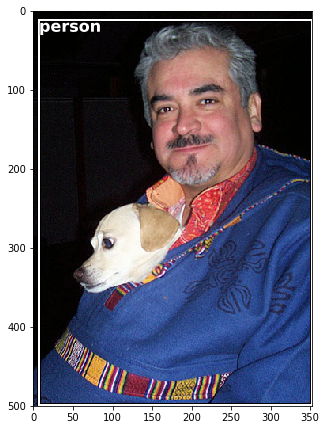

In [58]:
b=val_large_anno[1][0][0]
c=val_large_anno[1][0][1]
b=bb_hw(b)
ax = show_image(open_val_img(val_fns[1]), figsize=(5,10))
draw_rect(ax, b)
draw_text(ax, b[:2], categories[c], sz=16)

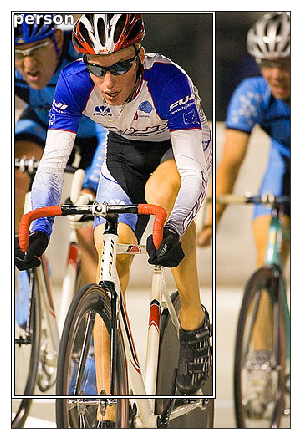

In [59]:
b= train_large_anno[23][0][0]
c=train_large_anno[23][0][1]
b = bb_hw(b)
ax = show_img(open_image(train_fns[23]), figsize=(5,10))
draw_rect(ax, b)
draw_text(ax, b[:2], categories[c], sz=16)

In [60]:
%pwd

'C:\\Users\\Srinjay\\Desktop\\VOCdevkit'

In [61]:
csv_path='C:\\Users\\Srinjay\\Desktop\\VOCdevkit\\'

In [62]:
import pandas as pd
df=pd.DataFrame({'fn': [train_fns[o] for o in train_ids],'cat':[categories[train_large_anno[i][0][1]] for i in train_ids]},
                columns=['fn','cat'])
df.to_csv('largest_anno_CSV')

In [63]:
df=pd.DataFrame({'fn':[val_fns[o] for o in val_ids],'cat':[categories[val_large_anno[i][0][1]] for i in val_ids]},
               columns=['fn','cat'])
df.to_csv('largest_anno_CSV_validation')

In [64]:
csv_file_val=csv_path + str('largest_anno_CSV_validation')

In [65]:
csv_file=csv_path + str('largest_anno_CSV')

In [66]:
print (csv_file)
df_largest=pd.read_csv(csv_file)

C:\Users\Srinjay\Desktop\VOCdevkit\largest_anno_CSV


In [67]:
print (csv_file_val)
df_largest_val=pd.read_csv(csv_file_val)

C:\Users\Srinjay\Desktop\VOCdevkit\largest_anno_CSV_validation


In [68]:
df_largest.head(10)

,Unnamed: 0,fn,cat
0,0,000012.jpg,car
1,1,000017.jpg,horse
2,2,000023.jpg,person
3,3,000026.jpg,car
4,4,000032.jpg,aeroplane
5,5,000033.jpg,aeroplane
6,6,000034.jpg,train
7,7,000035.jpg,person
8,8,000036.jpg,dog
9,9,000042.jpg,train


In [69]:
df_largest_val.head(10)

,Unnamed: 0,fn,cat
0,0,000001.jpg,person
1,1,000002.jpg,train
2,2,000003.jpg,sofa
3,3,000004.jpg,car
4,4,000006.jpg,diningtable
5,5,000008.jpg,chair
6,6,000010.jpg,horse
7,7,000011.jpg,cat
8,8,000013.jpg,cow
9,9,000014.jpg,car


In [70]:
print (df_largest.columns.values)

['Unnamed: 0' 'fn' 'cat']


In [71]:
new_largest_df=pd.DataFrame(df_largest,columns=['fn','cat'])

In [72]:
new_largest_df_val=pd.DataFrame(df_largest_val,columns=['fn','cat'])

In [73]:
new_largest_df.head(10)#,new_largest_df_val.head(10)

,fn,cat
0,000012.jpg,car
1,000017.jpg,horse
2,000023.jpg,person
3,000026.jpg,car
4,000032.jpg,aeroplane
5,000033.jpg,aeroplane
6,000034.jpg,train
7,000035.jpg,person
8,000036.jpg,dog
9,000042.jpg,train


In [74]:
new_largest_df_val.head(10)

,fn,cat
0,000001.jpg,person
1,000002.jpg,train
2,000003.jpg,sofa
3,000004.jpg,car
4,000006.jpg,diningtable
5,000008.jpg,chair
6,000010.jpg,horse
7,000011.jpg,cat
8,000013.jpg,cow
9,000014.jpg,car


In [75]:
new_largest_df.to_csv('use_this_csv.csv')

In [76]:
new_largest_df_val.to_csv('use_this_csv_val.val')

In [77]:
#rgb pixels mean and std for imagenet
imagenet_stats = ([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
inception_stats = ([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
inception_models =('inception_4', 'inceptionresnet_2')

In [78]:
new_largest_df.head(10)

,fn,cat
0,000012.jpg,car
1,000017.jpg,horse
2,000023.jpg,person
3,000026.jpg,car
4,000032.jpg,aeroplane
5,000033.jpg,aeroplane
6,000034.jpg,train
7,000035.jpg,person
8,000036.jpg,dog
9,000042.jpg,train


In [79]:
%pwd

'C:\\Users\\Srinjay\\Desktop\\VOCdevkit'

In [80]:
IMG_HEIGHT=224
IMG_WIDTH=224

In [81]:
img_names=train_fns.values()

In [82]:
X_images_train=np.empty((len(train_ids), IMG_HEIGHT, IMG_WIDTH,3), dtype='float32')
path1='C://Users//Srinjay//Desktop//VOCdevkit/VOC2007/JPEGImages/'
flags=cv2.IMREAD_UNCHANGED + cv2.IMREAD_ANYDEPTH + cv2. IMREAD_ANYCOLOR
for i,j in enumerate(img_names):
    ig=cv2.imread(os.path.join(path1,j),flags).astype(np.float32)
    ig=cv2.resize(ig,dsize=(IMG_HEIGHT,IMG_WIDTH))
    ig=ig/255
    ig=cv2.cvtColor(ig,cv2.COLOR_BGR2RGB)
    X_images_train[i]=ig

In [83]:
val_img_names=val_fns.values()

In [84]:
X_images_val=np.empty((len(val_ids),IMG_HEIGHT,IMG_WIDTH,3),dtype='float32')
val_path='C://Users//Srinjay//Desktop//VOCdevkit/VOC2007/val_JPEGImages/'
flags=cv2.IMREAD_UNCHANGED + cv2.IMREAD_ANYDEPTH + cv2. IMREAD_ANYCOLOR
for i,j in enumerate(val_img_names):
    ig=cv2.imread(os.path.join(val_path,j),flags).astype(np.float32)
    ig=cv2.resize(ig,dsize=(IMG_HEIGHT,IMG_WIDTH))
    ig=ig/255
    ig=cv2.cvtColor(ig,cv2.COLOR_BGR2RGB)
    X_images_val[i]=ig

In [85]:
def normalize(img):
    mean=np.mean(img)
    std=np.std(img)
    return ((img-mean)/mean)

def denormalize(img):
    mean=np.mean(img)
    std=np.std(img)
    return (img * std) + mean

In [86]:
Y_target=new_largest_df.cat.values
# Y_val_nohe=[]
# for i in train_ids:
#     x=categories[train_large_anno[i][0][1]]
#     Y_val_nohe.append(x)
# print (len(Y_val_nohe))

In [87]:
Y_target_val=new_largest_df_val.cat.values
# Y_train_nohe=[]
# for i in  val_ids:
#     x=categories[val_large_anno[i][0][1]]
#     Y_train_nohe.append(x)
# print (len(Y_train_nohe))

In [88]:
for i,j in zip(val_img_names,Y_target_val):
    print (i,j)

000001.jpg person
000002.jpg train
000003.jpg sofa
000004.jpg car
000006.jpg diningtable
000008.jpg chair
000010.jpg horse
000011.jpg cat
000013.jpg cow
000014.jpg car
000015.jpg bicycle
000018.jpg dog
000022.jpg horse
000025.jpg person
000027.jpg person
000028.jpg cat
000029.jpg dog
000031.jpg train
000037.jpg dog
000038.jpg person
000040.jpg bird
000043.jpg person
000045.jpg tvmonitor
000049.jpg cat
000053.jpg cat
000054.jpg bus
000055.jpg motorbike
000056.jpg horse
000057.jpg bird
000058.jpg motorbike
000059.jpg person
000062.jpg sheep
000067.jpg aeroplane
000068.jpg bird
000069.jpg boat
000070.jpg pottedplant
000071.jpg car
000074.jpg car
000075.jpg dog
000076.jpg person
000079.jpg dog
000080.jpg boat
000082.jpg car
000084.jpg diningtable
000085.jpg person
000086.jpg dog
000087.jpg train
000088.jpg train
000090.jpg person
000092.jpg cat
000094.jpg motorbike
000096.jpg person
000097.jpg chair
000098.jpg cat
000100.jpg train
000103.jpg car
000105.jpg boat
000106.jpg bird
000108.jpg s

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 bird
002105.jpg motorbike
002106.jpg cat
002107.jpg aeroplane
002110.jpg aeroplane
002111.jpg person
002113.jpg cat
002115.jpg cow
002118.jpg car
002119.jpg person
002121.jpg person
002122.jpg sofa
002123.jpg pottedplant
002127.jpg sofa
002128.jpg bicycle
002130.jpg motorbike
002131.jpg dog
002133.jpg sheep
002137.jpg sheep
002138.jpg dog
002141.jpg dog
002143.jpg car
002144.jpg bird
002147.jpg cat
002148.jpg train
002149.jpg car
002150.jpg train
002154.jpg car
002157.jpg aeroplane
002159.jpg person
002160.jpg dog
002161.jpg pottedplant
002162.jpg cat
002164.jpg person
002167.jpg diningtable
002168.jpg person
002173.jpg cow
002175.jpg boat
002177.jpg car
002185.jpg motorbike
002188.jpg diningtable
002189.jpg diningtable
002195.jpg person
002198.jpg aeroplane
002200.jpg dog
002203.jpg person
002204.jpg horse
002205.jpg cat
002206.jpg train
002207.jpg person
002210.jpg car
002211.jpg person
002216.jpg bus
002217.jpg aeroplane
002222.jpg cat
002223.jpg bus
002225.jpg boat
002227.jpg bicy

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




004041.jpg person
004042.jpg person
004043.jpg car
004044.jpg cat
004045.jpg sofa
004048.jpg cat
004049.jpg person
004050.jpg car
004053.jpg tvmonitor
004054.jpg person
004055.jpg bottle
004056.jpg bottle
004059.jpg bird
004061.jpg chair
004062.jpg dog
004063.jpg sofa
004064.jpg person
004065.jpg bus
004068.jpg sofa
004070.jpg motorbike
004071.jpg car
004072.jpg person
004074.jpg person
004078.jpg aeroplane
004079.jpg dog
004080.jpg car
004081.jpg pottedplant
004083.jpg bird
004084.jpg horse
004086.jpg dog
004088.jpg car
004090.jpg person
004094.jpg bus
004096.jpg sofa
004097.jpg car
004098.jpg diningtable
004099.jpg bus
004101.jpg sofa
004103.jpg person
004104.jpg bus
004107.jpg car
004109.jpg chair
004112.jpg person
004114.jpg cat
004115.jpg car
004116.jpg cat
004118.jpg person
004119.jpg sofa
004123.jpg boat
004124.jpg pottedplant
004125.jpg person
004126.jpg horse
004127.jpg person
004128.jpg person
004130.jpg dog
004132.jpg sofa
004134.jpg bottle
004139.jpg chair
004144.jpg perso

005935.jpg sofa
005936.jpg cat
005937.jpg sofa
005939.jpg sofa
005941.jpg diningtable
005942.jpg person
005943.jpg sofa
005944.jpg horse
005945.jpg person
005946.jpg tvmonitor
005949.jpg cat
005950.jpg boat
005953.jpg car
005955.jpg dog
005957.jpg cat
005958.jpg person
005959.jpg car
005962.jpg cat
005965.jpg aeroplane
005966.jpg person
005967.jpg horse
005969.jpg person
005972.jpg person
005973.jpg horse
005974.jpg car
005976.jpg chair
005977.jpg cat
005978.jpg bus
005982.jpg person
005986.jpg train
005987.jpg car
005993.jpg person
005994.jpg person
005997.jpg dog
005999.jpg train
006002.jpg person
006003.jpg bottle
006006.jpg car
006007.jpg dog
006008.jpg motorbike
006010.jpg diningtable
006013.jpg bus
006014.jpg boat
006015.jpg bicycle
006016.jpg car
006017.jpg car
006019.jpg car
006021.jpg cow
006022.jpg pottedplant
006024.jpg aeroplane
006031.jpg sofa
006032.jpg bicycle
006034.jpg car
006036.jpg person
006037.jpg dog
006039.jpg dog
006040.jpg person
006044.jpg dog
006047.jpg car
0

008488.jpg bus
008489.jpg dog
008490.jpg diningtable
008491.jpg person
008493.jpg dog
008496.jpg person
008497.jpg cat
008500.jpg train
008501.jpg person
008504.jpg car
008505.jpg person
008507.jpg bicycle
008508.jpg bird
008510.jpg sofa
008511.jpg bicycle
008515.jpg bicycle
008516.jpg cat
008520.jpg diningtable
008525.jpg tvmonitor
008527.jpg cow
008528.jpg diningtable
008531.jpg train
008532.jpg dog
008537.jpg aeroplane
008538.jpg person
008539.jpg cat
008540.jpg bicycle
008543.jpg sofa
008544.jpg dog
008545.jpg boat
008546.jpg bus
008547.jpg pottedplant
008548.jpg car
008551.jpg bicycle
008552.jpg train
008554.jpg aeroplane
008555.jpg bottle
008560.jpg person
008561.jpg tvmonitor
008563.jpg chair
008565.jpg bird
008566.jpg person
008567.jpg person
008569.jpg sofa
008570.jpg pottedplant
008571.jpg boat
008574.jpg horse
008575.jpg cat
008577.jpg person
008578.jpg boat
008579.jpg motorbike
008580.jpg train
008583.jpg person
008589.jpg bird
008590.jpg boat
008591.jpg diningtable
008593.

In [89]:
for i,j in zip (img_names,Y_target):
    print (i,j)


000032.jpg aeroplane
000033.jpg aeroplane
000034.jpg train
000035.jpg person
000036.jpg dog
000042.jpg train
000044.jpg chair
000047.jpg car
000048.jpg person
000061.jpg boat
000064.jpg bird
000066.jpg person
000073.jpg pottedplant
000077.jpg cat
000078.jpg dog
000083.jpg car
000089.jpg chair
000091.jpg car
000104.jpg person
000112.jpg dog
000122.jpg cat
000129.jpg person
000133.jpg person
000134.jpg car
000138.jpg person
000140.jpg sofa
000141.jpg bird
000147.jpg chair
000153.jpg car
000154.jpg boat
000159.jpg car
000161.jpg car
000162.jpg person
000163.jpg motorbike
000164.jpg motorbike
000171.jpg person
000173.jpg horse
000174.jpg person
000187.jpg tvmonitor
000189.jpg bird
000192.jpg person
000193.jpg person
000194.jpg horse
000198.jpg train
000200.jpg person
000207.jpg bus
000209.jpg cat
000219.jpg motorbike
000220.jpg car
000222.jpg person
000225.jpg sheep
000228.jpg aeroplane
000235.jpg diningtable
000242.jpg cat
000250.jpg diningtable
000256.jpg aeroplane
000259.jpg person
000

004929.jpg dog
004946.jpg person
004951.jpg train
004955.jpg cat
004958.jpg boat
004961.jpg car
004962.jpg car
004966.jpg bird
004968.jpg horse
004972.jpg bird
004973.jpg car
004974.jpg bird
004976.jpg diningtable
004984.jpg chair
004987.jpg person
004990.jpg sofa
004991.jpg diningtable
004992.jpg dog
004995.jpg horse
005001.jpg sheep
005004.jpg sofa
005006.jpg bird
005007.jpg tvmonitor
005016.jpg aeroplane
005018.jpg dog
005020.jpg car
005023.jpg bird
005024.jpg person
005026.jpg bus
005027.jpg tvmonitor
005029.jpg bicycle
005032.jpg train
005033.jpg bird
005045.jpg person
005047.jpg car
005052.jpg person
005057.jpg bicycle
005058.jpg sheep
005061.jpg diningtable
005065.jpg car
005068.jpg bus
005071.jpg car
005073.jpg boat
005078.jpg cat
005084.jpg bird
005086.jpg person
005090.jpg bus
005093.jpg motorbike
005094.jpg train
005097.jpg dog
005101.jpg chair
005107.jpg bicycle
005108.jpg aeroplane
005114.jpg person
005121.jpg dog
005122.jpg person
005124.jpg cow
005129.jpg chair
005130.jp

In [90]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

In [91]:
X_val_reshaped=np.empty((len(val_ids),3,IMG_HEIGHT,IMG_WIDTH),dtype='float32')
for j,l in enumerate(X_images_val):
    k=np.rollaxis(l,2)
    print (k.shape)
    X_val_reshaped[j]=k
print (X_val_reshaped.shape)

(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 22

(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224

(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 22

(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 22

In [92]:
X_train_reshaped=np.empty((len(train_ids),3, IMG_HEIGHT, IMG_WIDTH), dtype='float32')
for j,l in enumerate(X_images_train):
    k=np.rollaxis(l,2)
    print (k.shape)
    X_train_reshaped[j]=k
print (X_images_train.shape)

(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 22

(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 22

In [93]:
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(Y_target)
onehot_encoder = OneHotEncoder(sparse=False,dtype=np.float32)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
Y_encoded = onehot_encoder.fit_transform(integer_encoded)

In [94]:
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(Y_target_val)
onehot_encoder = OneHotEncoder(sparse=False,dtype=np.float32)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
Y_val_encoded = onehot_encoder.fit_transform(integer_encoded)

<h2>Change dtype of onehot encoded vectors to float64</h2>

In [95]:
print (Y_encoded.shape)
print (Y_val_encoded.shape)
print (Y_encoded.dtype)
print (Y_val_encoded.dtype)

(2501, 20)
(4952, 20)
float32
float32


In [96]:
Y_target_val.shape,X_val_reshaped.shape

((4952,), (4952, 3, 224, 224))

In [97]:
Y_target_val.dtype,X_val_reshaped.dtype

(dtype('O'), dtype('float32'))

In [98]:
X_train=torch.from_numpy(X_val_reshaped)
Y_train=torch.from_numpy(Y_val_encoded)
#Y_train=torch.from_numpy(Y_target_val)

In [99]:
X_val=torch.from_numpy(X_train_reshaped)
Y_val=torch.from_numpy(Y_encoded)
#Y_val=Y_target

In [100]:
X_train.dtype,Y_train.dtype

(torch.float32, torch.float32)

In [101]:
for i in Y_train:print (i)

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0.

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([1., 0

        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([0., 0

        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 1.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([1., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 1.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.])
tensor([0., 0

        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])


In [102]:
# data_transforms = {
#     'train': transforms.Compose([
#         #transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#     ]),
#     'val': transforms.Compose([
#         #transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#     ]),
# }
tfms=transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

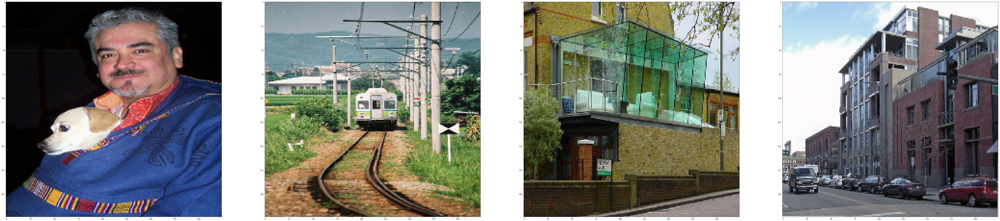

In [103]:
fix, ax = plt.subplots(1,4, figsize=(100,100))
for i,j,k,l in zip(range(4),range(9,17),range(18,26),range(27,35)):
    ax[i].imshow(np.transpose(X_train[i].numpy(),(1,2,0)))
#     ax[i,1].imshow(np.transpose(X[j].numpy(),(1,2,0)))
#     ax[i,2].imshow(np.transpose(X[k].numpy(),(1,2,0)))
#     ax[i,3].imshow(np.transpose(X[l].numpy(),(1,2,0)))
plt.show()

person


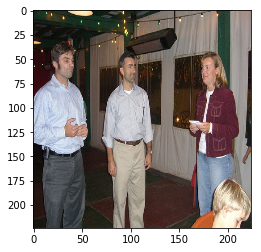

In [104]:
i=4000
npimg = X_train[i].numpy()
print (categories[int(np.argmax(Y_train[i])+1)])
plt.imshow(np.transpose(npimg,(1,2,0)))

In [105]:
train_dataset = utils.TensorDataset(X_train,Y_train)
test_dataset = utils.TensorDataset(X_val,Y_val)

In [106]:
train_loader = utils.DataLoader(train_dataset,batch_size=32,shuffle=True,num_workers=4)
test_loader = utils.DataLoader(test_dataset,batch_size=32,shuffle=True,num_workers=4)

In [107]:
dataloaders = {"train": train_loader, "val": test_loader}
print (X_train.shape)
print (Y_train.shape)

torch.Size([4952, 3, 224, 224])
torch.Size([4952, 20])


In [108]:
# pop_mean = []
# pop_std0 = []
# for i, data in enumerate(dataloader,0):
#     numpy_image = data[0].numpy()
#     batch_mean = np.mean(numpy_image, axis=(0,2,3))
#     batch_std0 = np.std(numpy_image, axis=(0,2,3))
#     pop_mean.append(batch_mean)
#     pop_std0.append(batch_std0)
    
# pop_mean = np.array(pop_mean).mean(axis=0)
# pop_std0 = np.array(pop_std0).mean(axis=0)

In [109]:
# pop_mean,pop_std0

In [110]:
for i_batch, sample_batched in enumerate(train_loader):
    if i_batch == 0:
        print(i_batch, sample_batched)
        x=sample_batched[0][1]
        y=sample_batched[1][1]

0 [tensor([[[[0.1343, 0.1374, 0.1172,  ..., 0.2474, 0.2491, 0.2418],
          [0.1757, 0.1721, 0.1502,  ..., 0.2434, 0.2425, 0.2392],
          [0.2032, 0.2027, 0.1713,  ..., 0.2429, 0.2431, 0.2427],
          ...,
          [0.8014, 0.7504, 0.6788,  ..., 0.5171, 0.5026, 0.5072],
          [0.8287, 0.8567, 0.7734,  ..., 0.5034, 0.4808, 0.4617],
          [0.7860, 0.7511, 0.7091,  ..., 0.4341, 0.4035, 0.3922]],

         [[0.1461, 0.1421, 0.1239,  ..., 0.2237, 0.2255, 0.2183],
          [0.1851, 0.1700, 0.1469,  ..., 0.2196, 0.2190, 0.2157],
          [0.2056, 0.1961, 0.1647,  ..., 0.2155, 0.2196, 0.2191],
          ...,
          [0.6139, 0.4869, 0.4158,  ..., 0.4102, 0.4058, 0.3968],
          [0.6227, 0.5990, 0.5330,  ..., 0.4021, 0.3945, 0.3645],
          [0.5621, 0.4763, 0.4549,  ..., 0.3404, 0.3272, 0.3015]],

         [[0.0768, 0.0830, 0.0721,  ..., 0.1378, 0.1341, 0.1268],
          [0.1026, 0.0909, 0.0769,  ..., 0.1344, 0.1327, 0.1294],
          [0.1115, 0.1083, 0.0771,  ...

         0., 0.]])]


torch.float32

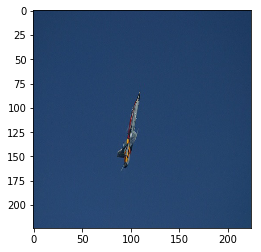

In [111]:
plt.imshow(np.transpose(x.numpy(),(1,2,0)))
x.dtype

In [112]:
y,y.dtype

(tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0.]), torch.float32)

In [113]:
categories[np.argmax(y.numpy())+1]

'aeroplane'

In [114]:
#X,Y
mean = np.array([0.485, 0.456, 0.406])
mean = torch.from_numpy(mean)
mean

tensor([0.4850, 0.4560, 0.4060], dtype=torch.float64)

In [115]:
std =np.array( [0.229, 0.224, 0.225])
std=torch.from_numpy(std)
std

tensor([0.2290, 0.2240, 0.2250], dtype=torch.float64)

In [116]:
#if results are not satisfactory ,then normalize according to imagenet stats
# # input = std - mean + std
# # input = np.clip(input, 0, 1)
# X_norm_np=np.empty((len(X),224,224,3),dtype=np.float32)
# for i,j in enumerate(X):
#     j=X[i].numpy()
#     j=np.rollaxis(j,2)
#     j=np.rollaxis(j,2)
#     #print (j.shape)
#     #j= (j-mean)/ std
#     X_norm_np[i]=j

In [117]:
print (X_train.shape,Y_train.shape)
print (X_train.mean())
print (X_train.std())

torch.Size([4952, 3, 224, 224]) torch.Size([4952, 20])
tensor(0.4218)
tensor(0.2749)


<h2>CLASSIFY LARGEST OBJECT IN IMAGE</h2>

In [118]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [119]:
# input_last_layer=model.fc.in_features
# num_classes=20
# model.fc=nn.Linear(input_last_layer,num_classes)

In [120]:
# X_train=X_train.cuda()
# X_val=X_val.cuda()
# Y_train=Y_train.cuda()
# Y_val=Y_val.cuda()

In [121]:
X_train.shape,X_val.shape,Y_target.shape,Y_target_val.shape,type(X_train),type(Y_train)

(torch.Size([4952, 3, 224, 224]),
 torch.Size([2501, 3, 224, 224]),
 (2501,),
 (4952,),
 torch.Tensor,
 torch.Tensor)

In [122]:
#loss = "categorical_crossentropy", optimizer = Adam(lr=0.0001), metrics=["accuracy"]
print(type(Y_val))
print(type(X_train))

<class 'torch.Tensor'>
<class 'torch.Tensor'>


In [123]:
# for i, data in enumerate(train_loader):
#         if i == 0:
#             # get the inputs
#             inputs, labels = data
#             op=model(inputs)
#             s=op.data
#             print (op.data)

In [124]:
# s.dtype,labels.long().dtype

In [125]:
model_resnet=models.resnet18(pretrained=True)
model_resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Co

In [126]:
new_model_2_removed = nn.Sequential(*list(model_resnet.children())[:-2])#use this for best results
new_model_1_removed=nn.Sequential(*list(model_resnet.children())[:-1])
new_model_3_removed=nn. Sequential(*list(model_resnet.children())[:-3])

In [132]:
for i_batched,(x,label) in enumerate(train_loader):
    if (i_batched) == 0:
        print(new_model_2_removed(x).shape)#(batch size * shape is op of last conv layer)
        #print (x.size[0])

torch.Size([32, 512, 7, 7])


In [133]:
512*7*7

25088

In [134]:
# #new_model = nn.Sequential(*list(model.children())[:-1])
# #The above line gets all layers except the last layer (it removes the last layer in model).
# input_last_layer=model_resnet.fc.in_features
# num_classes=20
# extra_layer=nn.Linear(input_last_layer,num,classes)
# #model.fc=nn.Linear(input_last_layer,num_classes)

In [135]:
# child_counter = 0
# for child in new_model_2_removed.children():
#     print(" child", child_counter, "is -")
#     print(child)
#     child_counter += 1

In [136]:
# child_counter = 0
# for child in new_model_2_removed.children():
#     if child_counter < 8:
#         print("child ",child_counter," was frozen")
#         for param in child.parameters():
#             param.requires_grad = False
#     child_counter += 1

In [137]:
conv_output=512*7*7
num_classes=20
intermediate_nodes=512
first_extra_layer=nn.Linear(512*7*7,intermediate_nodes)
second_extra_layer=nn.Linear(intermediate_nodes,num_classes)

In [138]:
for param in model_resnet.parameters():
    param.require_grad=False

num_ftrs = model_resnet.fc.in_features
model_resnet.fc = nn.Linear(num_ftrs, 20)

In [139]:
model=model_resnet
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Co

In [140]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [141]:
optimizer = optim.Adam(model.cuda().parameters(),lr=1e-4)
criterion = nn.CrossEntropyLoss()#this implements the softmax 

In [ ]:
#512 => 1000 => 20

In [142]:
model=model.cuda()

In [ ]:
 test_losses=[]
for epoch in range(15):  # loop over the dataset multiple times
    ave_loss = 0
    for batch_idx, (x, target) in enumerate(train_loader):
        optimizer.zero_grad()
        x, target = x.cuda(), target.cuda()
        #x, target = Variable(x), Variable(target)
        out = model(x)
        loss = criterion(out, torch.max(target, 1)[1])
        ave_loss = ave_loss * 0.9 + loss.item() * 0.1
        loss.backward()
        optimizer.step()
        if (batch_idx+1) % 100 == 0 or (batch_idx+1) == len(train_loader):
            print ('==>>> epoch: {}, batch index: {}, train loss: {:.6f}'.format(
                epoch, batch_idx+1, ave_loss))
    correct_cnt, ave_loss = 0, 0
    total_cnt = 0
    #test_losses=[]
    for batch_idx, (x, target) in enumerate(test_loader):
        x, target = x.cuda(), target.cuda()
        #x, target = Variable(x, volatile=True), Variable(target, volatile=True)
        out = model(x)
        loss = criterion(out, torch.max(target, 1)[1])
        _, pred_label = torch.max(out, 1)
        #total_cnt += x.size()[0]
        #correct_cnt += (pred_label == target).sum()
        #acc=(correct_cnt/total_cnt) * 100
        # smooth average
        ave_loss = ave_loss * 0.9 + loss.item() * 0.1
        #test_losses.append(ave_loss)
        if(batch_idx+1) % 100 == 0 or (batch_idx+1) == len(test_loader):
            print ('==>>> epoch: {}, batch index: {}, test loss: {:.6f}'.format(
                epoch, batch_idx+1, ave_loss))
    test_losses.append(ave_loss)

In [220]:
test_losses

[133.36172485351562,
 118.38209533691406,
 102.03118896484375,
 175.31591796875,
 107.60273742675781,
 104.340576171875,
 124.72494506835938,
 120.65330505371094,
 132.5425567626953,
 99.08760070800781]

In [ ]:
len(test_losses)

In [ ]:
test_losses=np.array(test_losses)
avg_loss=np.mean(test_losses)
avg_loss

In [ ]:
import shutil
def save_checkpoint(state,model,filename='chkpoint.pth.tar'):
    torch.save(state,filename)
    if model_resnet:
            shutil.copyfile(filename, 'model_best.pth.tar')

In [ ]:
save_checkpoint({
            'epoch': epoch + 1,
            'state_dict': model.state_dict(),
            'optimizer' : optimizer.state_dict(),
        }, model_resnet)

In [ ]:
torch.save(model, 'saved_resnet_model.pt')

In [143]:
loaded_model=torch.load('saved_resnet_model.pt')

In [144]:
dataiter = iter(test_loader)
images, labels = dataiter.next()
images,labels = images.cuda(), labels.cuda()

In [145]:
preds=loaded_model(images)

In [146]:
preds.shape

torch.Size([32, 20])

In [147]:
preds[0]

tensor([-0.6083, -0.4991, -1.2211, -2.7808, -3.5063, -1.2474, -3.5240, -3.0162,
         5.0247, -3.0404, -1.0812, -2.8446, -2.3850,  0.5546, -0.4670, -1.5939,
        -4.1516, -2.1235, -2.4303,  2.4125],
       device='cuda:0', grad_fn=<SelectBackward>)

In [148]:
#checking if applying softmax gives same result
import math
den=0
for i in preds[0]:
    den += math.exp(i)
den
probs=[]
for i in preds[0]:
    j=math.exp(i)/den
    probs.append(j)
probs
print (np.argmax(probs))

8


In [149]:
_,predicted = torch.max(preds, 1)

In [150]:
predicted

tensor([ 8, 12, 14,  5, 10, 14, 14, 14,  3, 14,  8,  6,  2, 14, 14,  6, 14,  2,
        11, 13,  6,  6, 14, 18, 17,  3, 11,  3,  9, 14,  7,  0],
       device='cuda:0')

C:\Users\Srinjay\Miniconda3\envs\torch\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


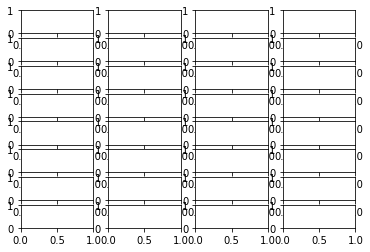

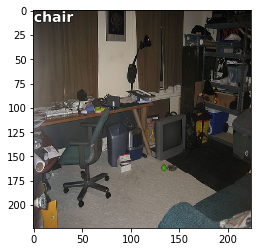

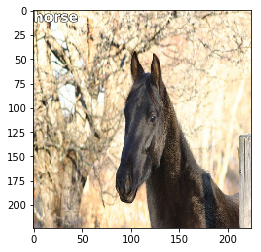

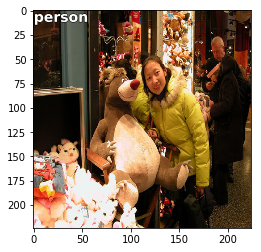

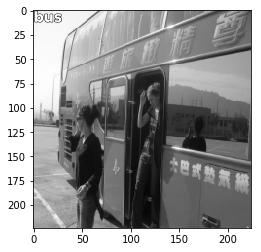

...

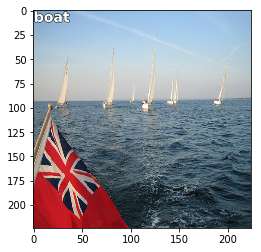

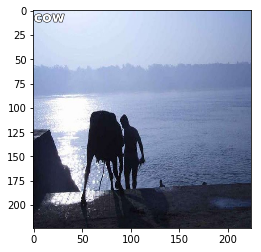

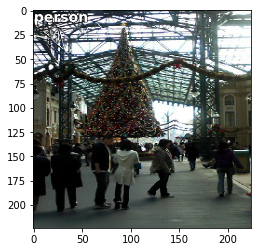

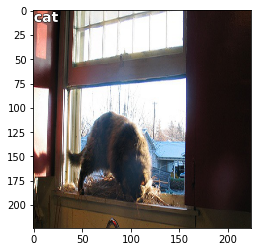

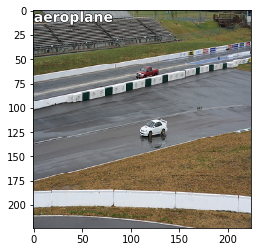

<Figure size 432x288 with 0 Axes>

In [151]:
fig, axes = plt.subplots(8,4)
for i,ax in enumerate(axes.flat):
    ima=images[i]
    b = categories[int(predicted[i])+1]
    ax = show_image(np.transpose(ima,(1,2,0)), ax=ax)
    draw_text(ax, (0,0),b)
plt.show()
plt.tight_layout()

In [152]:
#indices to display 1,2,3,4,5,6,7,8,10,11,12,13,14
#bad_cases 0,9,18,21,23,25

In [153]:
# prediccategories=[predicted[j] for j in range(2)]

In [154]:
# IMPORTANT TRIAL
# for epoch in range(1):  # loop over the dataset multiple times
#     running_loss = 0.0
#     for i, data in enumerate(train_loader):
#         inputs, labels = data
#         inputs=inputs.cuda()
#         labels=labels.cuda()
#         #_,labels=labels.max(dim=0)
#         # zero the parameter gradients
#         optimizer.zero_grad()
#         # forward + backward + optimize
#         outputs = model(inputs)
#         #outputs=outputs.cuda()
#         loss = criterion(outputs,torch.max(labels, 1)[1])
#         loss.backward()
#         optimizer.step()
#         # print statistics
#         running_loss += loss.item()
#         if i % 20 == 19:    # print every 20 mini-batches
#             print('[%d, %5d] loss: %.3f' %
#                   (epoch + 1, i + 1, running_loss / 20))
#             running_loss = 0.0

In [ ]:
#creating a dataset :
#independent => images
#dependent => tuple(bbox co-ordinates,categries)

<h2>DRAW A BOUNDING BOX AROUND THE LARGEST OBJECT IN IMAGE</h2>

In [155]:
val_large_anno[1][0][0].dtype

dtype('int32')

In [156]:
df_bbox=pd.DataFrame({'fn': [val_fns[o] for o in val_ids],'cat':[val_large_anno[i][0][0] for i in val_ids]},
                columns=['fn','cat'])
df_bbox.to_csv('train_bbox_CSV.csv')

In [157]:
csv_bbox_file=os.path.join(csv_path,'train_bbox_CSV.csv')

In [158]:
df_bbox_train=pd.read_csv(csv_bbox_file)

In [159]:
df_bbox_train.head(10)

,Unnamed: 0,fn,cat
0,0,000001.jpg,[ 11 7 497 351]
1,1,000002.jpg,[199 138 300 206]
2,2,000003.jpg,[154 122 194 214]
3,3,000004.jpg,[329 361 388 499]
4,4,000006.jpg,[208 153 374 368]
5,5,000008.jpg,[ 15 191 248 363]
6,6,000010.jpg,[ 96 86 426 257]
7,7,000011.jpg,[ 50 125 307 329]
8,8,000013.jpg,[159 298 251 445]
9,9,000014.jpg,[193 184 315 499]


In [160]:
list(df_bbox_train)

['Unnamed: 0', 'fn', 'cat']

In [161]:
df_bbox_train_fixed=pd.DataFrame(df_bbox_train,columns=['fn','cat'])

In [162]:
df_bbox_train_fixed.head(10)

,fn,cat
0,000001.jpg,[ 11 7 497 351]
1,000002.jpg,[199 138 300 206]
2,000003.jpg,[154 122 194 214]
3,000004.jpg,[329 361 388 499]
4,000006.jpg,[208 153 374 368]
5,000008.jpg,[ 15 191 248 363]
6,000010.jpg,[ 96 86 426 257]
7,000011.jpg,[ 50 125 307 329]
8,000013.jpg,[159 298 251 445]
9,000014.jpg,[193 184 315 499]


In [163]:
Y_bbox_train=[val_large_anno[i][0][0] for i in val_ids]

In [164]:
imgs=df_bbox_train_fixed.fn.values

In [165]:
Y_bbox_train=np.array(Y_bbox_train,np.float32)

In [167]:
Y_bbox_train[0].dtype

dtype('float32')

In [168]:
Y_bbox_train[0]

array([ 11.,   7., 497., 351.], dtype=float32)

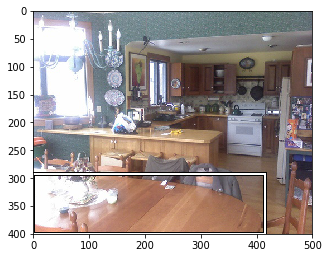

In [169]:
i=513
sample_img=X_train[i]
b=bb_hw(Y_bbox_train[i])
ax = show_image(open_val_img(imgs[i]), figsize=(5,10))
draw_rect(ax, b)

In [170]:
df_bbox=pd.DataFrame({'fn': [train_fns[o] for o in train_ids],'cat':[train_large_anno[i][0][0] for i in train_ids]},
                columns=['fn','cat'])
df_bbox.to_csv('val_bbox_CSV.csv')

In [171]:
csv_bbox_file=os.path.join(csv_path,'val_bbox_CSV.csv')

In [172]:
df_bbox_val=pd.read_csv(csv_bbox_file)

In [173]:
df_bbox_val.head(10)

,Unnamed: 0,fn,cat
0,0,000012.jpg,[ 96 155 269 350]
1,1,000017.jpg,[ 77 89 335 402]
2,2,000023.jpg,[ 1 2 461 242]
3,3,000026.jpg,[124 89 211 336]
4,4,000032.jpg,[ 77 103 182 374]
5,5,000033.jpg,[106 8 262 498]
6,6,000034.jpg,[166 115 399 359]
7,7,000035.jpg,[ 97 217 317 464]
8,8,000036.jpg,[ 78 26 343 318]
9,9,000042.jpg,[ 31 262 294 499]


In [174]:
df_bbox_val_fixed=pd.DataFrame(df_bbox_val,columns=['fn','cat'])

In [175]:
df_bbox_val_fixed.head(10)

,fn,cat
0,000012.jpg,[ 96 155 269 350]
1,000017.jpg,[ 77 89 335 402]
2,000023.jpg,[ 1 2 461 242]
3,000026.jpg,[124 89 211 336]
4,000032.jpg,[ 77 103 182 374]
5,000033.jpg,[106 8 262 498]
6,000034.jpg,[166 115 399 359]
7,000035.jpg,[ 97 217 317 464]
8,000036.jpg,[ 78 26 343 318]
9,000042.jpg,[ 31 262 294 499]


In [176]:
imgs_val=df_bbox_val_fixed.fn.values

In [177]:
Y_bbox_val=[train_large_anno[i][0][0] for i in train_ids]

In [178]:
Y_bbox_val=np.array(Y_bbox_val,np.float32)

In [179]:
Y_bbox_val[0].dtype

dtype('float32')

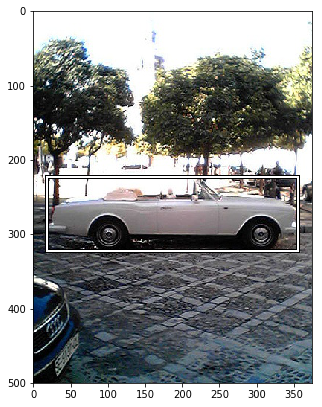

In [180]:
i=62
sample_img=X_val[i]
b=bb_hw(Y_bbox_val[i])
ax = show_image(open_image(imgs_val[i]), figsize=(5,10))
draw_rect(ax, b)

In [181]:
X_train.dtype,X_train.shape

(torch.float32, torch.Size([4952, 3, 224, 224]))

In [182]:
X_val.dtype,X_val.shape

(torch.float32, torch.Size([2501, 3, 224, 224]))

In [183]:
Y_bbox_train.dtype,Y_bbox_train.shape

(dtype('float32'), (4952, 4))

In [184]:
Y_bbox_val.dtype,Y_bbox_val.shape

(dtype('float32'), (2501, 4))

In [185]:
# for i,j in enumerate(Y_bbox_train):
#     j=bb_hw(j)
#     Y_bbox_train[i]=j

# for i,j in enumerate(Y_bbox_val):
#     j=bb_hw(j)
#     Y_bbox_val[i]=j

In [186]:
for i,j in enumerate(Y_bbox_train):
    print(j)

[ 11.   7. 497. 351.]
[199. 138. 300. 206.]
[154. 122. 194. 214.]
[329. 361. 388. 499.]
[208. 153. 374. 368.]
[ 15. 191. 248. 363.]
[ 96.  86. 426. 257.]
[ 50. 125. 307. 329.]
[159. 298. 251. 445.]
[193. 184. 315. 499.]
[135.  76. 357. 359.]
[ 29.  30. 278. 357.]
[102.  67. 282. 367.]
[  1. 319. 374. 495.]
[100. 173. 350. 348.]
[ 17.  62. 499. 373.]
[ 62.  55. 289. 283.]
[ 76.  40. 254. 429.]
[ 95.  60. 338. 463.]
[110. 191. 239. 260.]
[ 51.   0. 289. 383.]
[  5.  18. 499. 322.]
[ 63. 279. 251. 482.]
[130. 177. 226. 355.]
[ 11.  35. 261. 424.]
[ 53.  23. 291. 471.]
[131. 208. 221. 274.]
[ 59. 164. 333. 386.]
[ 52. 132. 357. 384.]
[108.  28. 374. 358.]
[209. 109. 499. 327.]
[187.  57. 309. 270.]
[ 71.  43. 209. 449.]
[ 44.  26. 374. 265.]
[ 63.  18. 189. 423.]
[155. 312. 197. 357.]
[ 74.  60. 273. 442.]
[ 60.  57. 282. 474.]
[ 82. 101. 347. 221.]
[ 77.  62. 374. 264.]
[ 52.   0. 356. 389.]
[215. 397. 305. 420.]
[ 92.  21. 297. 492.]
[181. 155. 280. 331.]
[ 69.  21. 326. 253.]
[130. 307.

[128.  94. 261. 457.]
[ 70.  61. 327. 499.]
[161.  67. 214. 114.]
[322.  88. 435. 272.]
[231.  51. 449. 333.]
[ 88. 274. 255. 340.]
[ 23.  26. 289. 499.]
[ 46.   2. 332. 499.]
[121. 254. 258. 400.]
[ 40.  75. 373. 417.]
[ 24.  88. 346. 464.]
[166.  18. 374. 358.]
[ 39.   2. 298. 497.]
[ 15.  46. 315. 439.]
[ 99.   0. 374. 466.]
[ 47.  78. 308. 411.]
[ 24.  46. 332. 478.]
[  0.   7. 372. 453.]
[112. 123. 368. 492.]
[188.   0. 374. 499.]
[  0.   0. 373. 445.]
[  1. 110. 332. 482.]
[  2.   7. 330. 481.]
[ 29.   0. 374. 440.]
[264.  74. 458. 451.]
[110.  96. 239. 451.]
[ 84. 188. 269. 305.]
[ 65. 102. 399. 488.]
[ 99. 111. 408. 440.]
[106.  90. 370. 168.]
[ 39.  28. 316. 499.]
[ 51.  23. 230. 239.]
[157. 259. 232. 359.]
[100. 138. 162. 195.]
[  4. 162. 466. 282.]
[271.   0. 332. 499.]
[104.   0. 332. 499.]
[138.  54. 220. 242.]
[ 87. 113. 255. 248.]
[ 30.  33. 499. 199.]
[123.  25. 268. 478.]
[132. 148. 268. 336.]
[ 54.  57. 372. 389.]
[130. 226. 148. 290.]
[ 13.  70. 315. 321.]
[ 49. 104.

[ 83. 195. 286. 457.]
[123. 240. 299. 428.]
[142. 275. 374. 381.]
[116. 241. 150. 276.]
[ 87.   0. 332. 490.]
[ 96.  92. 265. 432.]
[ 73. 103. 374. 428.]
[ 53. 228. 237. 350.]
[ 51. 202. 167. 341.]
[130. 105. 380. 385.]
[156. 287. 219. 339.]
[164. 324. 191. 354.]
[ 70. 188. 353. 285.]
[  0.  11. 273. 336.]
[241. 113. 499. 374.]
[ 41.  19. 279. 488.]
[229. 310. 374. 467.]
[ 34.  35. 332. 456.]
[187. 137. 310. 365.]
[276. 180. 455. 329.]
[123.   4. 373. 471.]
[150. 157. 221. 319.]
[141. 320. 166. 428.]
[ 53.   6. 337. 499.]
[178. 253. 374. 497.]
[304.   0. 374. 326.]
[146. 227. 229. 399.]
[223. 440. 324. 485.]
[215.   1. 372. 157.]
[ 98.   2. 315. 433.]
[ 58.  93. 329. 409.]
[105.  57. 215. 461.]
[ 83.   8. 332. 225.]
[ 58.   5. 339. 499.]
[187. 166. 372. 454.]
[ 29.   0. 374. 469.]
[ 55.   0. 328. 285.]
[ 95.  60. 349. 446.]
[ 40. 176. 359. 328.]
[181.  58. 374. 234.]
[ 60.   0. 499. 372.]
[119.  63. 416. 321.]
[ 41.   2. 371. 399.]
[326.   1. 499. 374.]
[ 14.  60. 313. 396.]
[110.   5.

[333. 191. 496. 312.]
[103.  64. 318. 395.]
[ 72.  41. 154. 272.]
[ 13.  22. 342. 318.]
[  0.   0. 475. 219.]
[237.  80. 358. 459.]
[ 19.  32. 329. 449.]
[ 94.  36. 303. 432.]
[217. 117. 330. 324.]
[ 43. 145. 286. 296.]
[236. 395. 281. 492.]
[101.   1. 330. 177.]
[ 29.  30. 301. 384.]
[ 78. 340. 282. 423.]
[116.  24. 470. 373.]
[126.   0. 331. 275.]
[ 44.  46. 372. 470.]
[ 37. 127. 267. 437.]
[ 72.   5. 470. 325.]
[106.  74. 499. 334.]
[  4.  25. 343. 356.]
[260. 142. 492. 333.]
[ 77. 193. 230. 360.]
[ 35.  92. 332. 466.]
[218. 209. 362. 273.]
[115.   1. 484. 193.]
[ 95. 126. 202. 364.]
[ 65.  60. 405. 275.]
[  8.   0. 420. 372.]
[202. 154. 311. 258.]
[ 76. 234. 349. 418.]
[ 28.  14. 323. 326.]
[135. 213. 195. 329.]
[224.  82. 374. 309.]
[ 12.   0. 374. 497.]
[  0.  83. 330. 498.]
[163. 424. 255. 456.]
[165. 366. 374. 499.]
[ 58.   2. 332. 409.]
[  1.   0. 374. 440.]
[144. 166. 374. 425.]
[ 38. 104. 320. 376.]
[ 46.  18. 332. 498.]
[ 42.  60. 318. 399.]
[ 18.   0. 254. 498.]
[ 61.   4.

[ 90.  71. 499. 308.]
[220. 205. 302. 338.]
[  8. 347. 137. 425.]
[  7. 262. 271. 499.]
[ 78. 263. 180. 499.]
[117. 287. 225. 460.]
[ 32.  62. 499. 342.]
[116. 261. 233. 432.]
[ 34.  51. 197. 112.]
[123. 110. 374. 294.]
[105. 294. 135. 325.]
[ 83.  66. 313. 476.]
[ 57. 109. 388. 299.]
[  0.  16. 359. 499.]
[116. 170. 374. 280.]
[ 79. 152. 285. 415.]
[158.  25. 339. 282.]
[ 87. 157. 373. 340.]
[105.   0. 371. 443.]
[  0. 122. 348. 420.]
[231.  20. 415. 316.]
[192.  53. 485. 305.]
[ 29.   4. 337. 263.]
[ 24.   0. 328. 499.]
[126. 163. 252. 405.]
[179.  51. 402. 297.]
[ 52.   4. 395. 255.]
[ 57.   1. 330. 488.]
[112. 176. 307. 469.]
[172. 152. 374. 249.]
[165. 129. 232. 256.]
[ 46.   1. 332. 115.]
[128. 170. 189. 346.]
[128. 216. 209. 274.]
[ 35.  58. 321. 434.]
[ 35. 172. 374. 489.]
[ 61. 126. 270. 203.]
[ 97.  74. 325. 421.]
[  4.  96. 331. 499.]
[171. 113. 344. 371.]
[  9. 178. 468. 294.]
[  0.   0. 234. 226.]
[ 47. 144. 499. 327.]
[ 45. 245. 150. 278.]
[106. 308. 255. 473.]
[ 70.   4.

[140.  72. 297. 354.]
[  6.  28. 374. 407.]
[ 92.  34. 246. 194.]
[175. 147. 374. 367.]
[183. 180. 265. 311.]
[ 39.  95. 202. 201.]
[213.  31. 378. 126.]
[ 30.   0. 354. 438.]
[ 68.  35. 382. 258.]
[138.  13. 345. 305.]
[101.   2. 374. 468.]
[ 73.  27. 321. 183.]
[ 10.  74. 330. 435.]
[ 63. 168. 154. 283.]
[140.  79. 246. 343.]
[ 66.  37. 465. 442.]
[ 45.  32. 307. 450.]
[ 35. 139. 332. 499.]
[  0.  15. 268. 199.]
[228. 146. 332. 230.]
[  0. 283. 374. 499.]
[ 25.  53. 361. 272.]
[  2.  23. 499. 354.]
[136.   1. 499. 374.]
[ 42.  92. 246. 292.]
[ 23. 240. 115. 267.]
[  0.   0. 362. 354.]
[132. 138. 271. 498.]
[134. 100. 357. 239.]
[ 87. 198. 374. 368.]
[  7.   0. 332. 304.]
[107. 187. 212. 432.]
[ 21.   0. 244. 423.]
[  0.   0. 234. 220.]
[ 46.  50. 498. 411.]
[109.  79. 224. 458.]
[ 92. 175. 373. 497.]
[ 33.   0. 332. 437.]
[ 17.  47. 358. 248.]
[ 49.  81. 250. 330.]
[113.  76. 272. 360.]
[268. 157. 283. 234.]
[204. 262. 303. 328.]
[ 28.  43. 492. 374.]
[  8.   1. 444. 407.]
[ 14.  43.

[ 11.   1. 499. 332.]
[244.   1. 374. 499.]
[ 88.   0. 317. 440.]
[126.  14. 369. 143.]
[ 61.  30. 221. 158.]
[  1.  79. 292. 328.]
[146. 156. 367. 398.]
[ 32.  16. 374. 319.]
[ 15.   1. 341. 499.]
[182.   1. 374. 499.]
[103. 120. 296. 334.]
[ 66.   1. 316. 214.]
[ 14.   0. 297. 321.]
[ 81.  89. 469. 329.]
[  0.   0. 237. 299.]
[163. 236. 180. 262.]
[  1.   9. 461. 363.]
[ 88. 316. 332. 445.]
[203. 398. 243. 499.]
[185. 231. 307. 396.]
[ 92. 136. 367. 241.]
[  0.  47. 333. 499.]
[ 36. 234. 206. 475.]
[  1.   1. 393. 498.]
[185. 191. 232. 310.]
[182. 195. 239. 226.]
[186. 119. 275. 391.]
[ 76.  40. 366. 402.]
[ 61. 230. 306. 499.]
[ 44.  12. 332. 339.]
[ 68. 212. 374. 426.]
[152.  51. 374. 151.]
[ 98. 282. 349. 388.]
[131. 178. 240. 280.]
[ 15.  79. 283. 474.]
[ 41.   3. 278. 498.]
[  0.  43. 372. 499.]
[269. 314. 326. 499.]
[ 96.  12. 245. 480.]
[275.  32. 374. 442.]
[ 89.  81. 360. 264.]
[196.  92. 374. 392.]
[  1.   1. 316. 499.]
[  0.   0. 483. 326.]
[240. 234. 295. 278.]
[137. 188.

[ 47. 191. 348. 313.]
[ 69. 139. 261. 400.]
[ 97.  11. 371. 486.]
[ 25.   0. 363. 421.]
[ 92.  33. 356. 171.]
[  7.  65. 303. 345.]
[ 95. 294. 218. 499.]
[130. 237. 290. 464.]
[195.  97. 370. 372.]
[104.  64. 293. 499.]
[174. 109. 363. 282.]
[ 14.  24. 228. 486.]
[124.  11. 230. 484.]
[ 81.  55. 352. 482.]
[  0. 101. 348. 499.]
[ 10. 124. 208. 442.]
[127.  87. 374. 415.]
[ 37.   7. 436. 372.]
[ 24. 177. 364. 499.]
[  2.   1. 255. 496.]
[198.  17. 499. 332.]
[126.   0. 241. 113.]
[  8.  29. 331. 448.]
[256. 115. 374. 499.]
[ 67.  19. 297. 499.]
[194.  46. 374. 343.]
[ 72. 102. 295. 374.]
[  2.  64. 223. 239.]
[130.  31. 330. 477.]
[106. 170. 374. 286.]
[107. 202. 234. 308.]
[ 28.  27. 301. 312.]
[115. 184. 208. 403.]
[ 36.  15. 308. 488.]
[  7. 322. 358. 493.]
[  1.   3. 374. 432.]
[114. 118. 308. 384.]
[149. 102. 306. 178.]
[ 12.  30. 374. 484.]
[  1. 134. 374. 482.]
[166.  16. 374. 161.]
[261. 169. 373. 499.]
[ 22. 123. 317. 448.]
[ 39. 219. 247. 346.]
[ 49.  55. 421. 232.]
[192. 110.

[ 76. 133. 499. 299.]
[ 46.  63. 295. 423.]
[ 86.  99. 259. 357.]
[ 42. 103. 374. 411.]
[ 92. 134. 332. 345.]
[129. 165. 314. 270.]
[ 53.  39. 282. 442.]
[ 70. 418. 353. 479.]
[ 76. 204. 363. 332.]
[ 54.  64. 333. 411.]
[ 75. 174. 247. 324.]
[  0.  21. 374. 499.]
[181. 116. 267. 241.]
[293. 297. 371. 495.]
[ 19. 176. 453. 324.]
[251. 225. 318. 271.]
[ 39.   3. 300. 481.]
[ 67.  28. 345. 461.]
[ 67.   0. 374. 495.]
[ 45.  68. 168. 248.]
[  2. 174. 499. 387.]
[ 89.  51. 233. 441.]
[108.  19. 314. 474.]
[245. 287. 318. 395.]
[ 35.   5. 136. 286.]
[  2. 106. 330. 275.]
[ 20. 100. 181. 311.]
[ 49. 194. 180. 368.]
[ 91.   8. 374. 280.]
[  6. 158. 374. 499.]
[160.  67. 209. 160.]
[  0.   0. 389. 330.]
[225. 205. 477. 370.]
[ 13.  78. 374. 366.]
[198. 319. 224. 380.]
[ 50. 128. 373. 496.]
[106.   0. 499. 290.]
[ 85. 151. 240. 260.]
[108.   2. 332. 499.]
[208.  97. 360. 263.]
[273.   1. 450. 254.]
[ 68. 262. 332. 499.]
[ 87.  59. 309. 308.]
[  0.  65. 312. 499.]
[146.   3. 267. 110.]
[ 14. 232.

[144. 212. 220. 279.]
[ 31.  21. 300. 495.]
[189.  81. 417. 201.]
[ 67.  59. 309. 398.]
[255. 193. 352. 478.]
[107.   0. 238. 344.]
[ 84.  26. 370. 499.]
[130. 248. 328. 323.]
[156. 224. 293. 386.]
[162. 113. 329. 428.]
[  2.   3. 373. 499.]
[ 12.  94. 291. 241.]
[143. 270. 362. 445.]
[115. 245. 374. 410.]
[ 54.   8. 306. 458.]
[ 20.  57. 457. 295.]
[  9.   2. 307. 484.]
[280.   0. 470. 209.]
[103.  73. 374. 238.]
[187. 272. 304. 484.]
[ 18.  54. 328. 475.]
[171. 130. 439. 249.]
[ 28. 110. 210. 174.]
[185. 305. 321. 441.]
[ 40. 145. 282. 344.]
[308.   0. 498.  94.]
[125.  81. 294. 499.]
[260. 155. 460. 264.]
[  0.   1. 372. 499.]
[ 95. 127. 373. 340.]
[ 51. 110. 217. 187.]
[  2.  46. 338. 308.]
[122. 215. 247. 430.]
[216.  29. 481. 293.]
[110. 225. 194. 301.]
[143. 215. 327. 484.]
[  0.  99. 373. 499.]
[154.  89. 368. 424.]
[195. 296. 374. 499.]
[ 91. 129. 374. 382.]
[ 61.   7. 344. 478.]
[  0.  90. 332. 499.]
[ 28. 205. 362. 443.]
[194.  24. 237.  62.]
[135. 233. 240. 266.]
[ 93. 105.

[189.  58. 235. 159.]
[ 23.   6. 481. 264.]
[ 94.  31. 372. 247.]
[ 43.  52. 364. 442.]
[126. 292. 304. 389.]
[  1.   0. 252. 228.]
[ 45.  77. 235. 198.]
[160. 266. 330. 499.]
[233. 195. 292. 304.]
[  0.   2. 373. 499.]
[  1.   2. 374. 499.]
[252.  37. 496. 342.]
[ 17. 382. 197. 489.]
[ 26. 166. 374. 499.]
[ 31.   0. 374. 293.]
[ 67.   0. 286. 464.]
[115. 161. 349. 435.]
[127.   0. 373. 499.]
[234. 230. 291. 310.]
[ 79.  60. 208. 361.]
[  1. 138. 222. 344.]
[  7.   0. 499. 337.]
[197. 245. 234. 265.]
[ 37. 123. 329. 372.]
[165. 297. 303. 354.]
[ 62.   5. 314. 499.]
[ 82. 166. 171. 206.]
[162. 313. 353. 481.]
[ 67. 199. 304. 499.]
[ 30.  16. 364. 469.]
[210. 293. 309. 356.]
[ 92. 247. 300. 375.]
[288.   1. 332. 180.]
[112. 126. 338. 333.]
[ 47.  38. 317. 485.]
[168.   0. 278. 497.]
[276.  67. 311.  82.]
[ 14.   0. 332. 497.]
[ 46.  56. 453. 332.]
[150. 275. 374. 499.]
[  1.   0. 374. 499.]
[113.   0. 399. 460.]
[ 54. 159. 155. 214.]
[165. 121. 291. 304.]
[ 88.  24. 418. 310.]
[145.  64.

[ 42. 217. 268. 411.]
[ 38.  99. 309. 286.]
[ 40.   6. 372. 414.]
[ 11.   0. 499. 294.]
[212.  72. 374. 499.]
[ 49.   7. 212. 176.]
[ 15.   7. 329. 492.]
[ 97.  31. 211. 464.]
[223.  40. 421. 213.]
[ 72.  33. 416. 357.]
[ 52.  18. 298. 399.]
[138. 230. 355. 451.]
[ 83.  32. 341. 478.]
[ 35.   3. 371. 492.]
[ 97.   7. 290. 425.]
[156. 187. 372. 348.]
[  6.  20. 426. 488.]
[134. 205. 319. 264.]
[302.  32. 499. 364.]
[ 21. 239. 254. 473.]
[ 65.  99. 374. 498.]
[ 38.   0. 299. 247.]
[ 88.  91. 290. 231.]
[ 95.  81. 249. 416.]
[295. 221. 420. 458.]
[ 52. 166. 374. 499.]
[ 64.  14. 374. 297.]
[ 83.   0. 374. 422.]
[ 33. 102. 243. 369.]
[  0. 132. 165. 396.]
[ 83.  83. 263. 355.]
[ 83.  58. 328. 401.]
[122.   1. 485. 251.]
[ 94. 139. 244. 438.]
[161. 103. 220. 374.]
[ 70.  63. 374. 499.]
[105. 161. 308. 452.]
[ 27.   1. 499. 325.]
[183.  28. 272. 162.]
[133.   1. 374. 499.]
[163. 136. 427. 249.]
[275.   0. 463.  53.]
[ 87.  88. 305. 366.]
[  3. 110. 283. 363.]
[ 81. 153. 187. 288.]
[ 33.   0.

[106.   0. 374. 204.]
[ 25. 156. 318. 364.]
[ 67. 115. 374. 307.]
[ 73.   0. 374. 374.]
[ 63. 280. 374. 499.]
[ 73.  17. 332. 490.]
[ 81.  84. 481. 477.]
[ 10. 177. 374. 408.]
[ 35.  64. 315. 399.]
[100. 127. 370. 393.]
[219. 146. 293. 187.]
[120.  78. 274. 398.]
[ 28.  15. 449. 280.]
[ 95. 105. 367. 286.]
[124.  16. 374. 337.]
[ 84. 250. 374. 369.]
[148. 148. 359. 396.]
[ 98.   0. 499. 346.]
[230. 411. 288. 451.]
[ 65. 103. 421. 191.]
[ 64.   2. 498. 332.]
[ 58.  22. 293. 445.]
[322. 255. 499. 369.]
[ 76. 289. 289. 421.]
[ 91.  69. 286. 354.]
[166.   1. 499. 374.]
[229.  68. 374. 414.]
[198. 273. 325. 340.]
[ 28. 181. 372. 457.]
[ 49.  21. 441. 290.]
[ 49.  45. 318. 404.]
[ 22.  51. 331. 380.]
[304.  35. 364. 168.]
[105. 170. 318. 366.]
[ 80.   1. 316. 420.]
[145. 226. 188. 257.]
[340.   1. 405. 137.]
[ 72. 122. 247. 361.]
[145. 156. 349. 283.]
[ 98. 132. 284. 374.]
[119. 168. 224. 276.]
[ 40.  48. 298. 493.]
[154.  48. 499. 419.]
[ 52.  10. 331. 384.]
[ 46.  52. 319. 457.]
[109. 211.

[ 70.  85. 247. 340.]
[  4.   5. 499. 332.]
[ 65.  60. 499. 354.]
[154. 174. 235. 297.]
[ 76. 184. 371. 427.]
[ 86.   1. 432. 499.]
[  0.   0. 198. 127.]
[139. 335. 374. 400.]
[ 32.  74. 328. 402.]
[155. 117. 374. 381.]
[170. 106. 255. 261.]
[ 74.   9. 252. 489.]
[  2.   2. 327. 432.]
[ 81.  49. 366. 499.]
[ 55. 110. 342. 337.]
[118.   0. 437. 499.]
[130. 344. 255. 425.]
[161.  35. 339. 467.]
[273.  71. 372. 400.]
[173.  89. 374. 432.]
[ 62.  38. 429. 172.]
[174. 193. 233. 294.]
[185.  96. 328. 322.]
[214.  93. 374. 499.]
[118. 190. 295. 304.]
[ 97.   0. 362. 474.]
[  0. 265. 279. 448.]
[ 19.   0. 331. 146.]
[ 61.  57. 336. 486.]
[208.   0. 374. 433.]
[ 79.  57. 351. 441.]
[158.  92. 228. 193.]
[152.  53. 371. 343.]
[ 27.  17. 237. 488.]
[  0.   0. 374. 460.]
[124. 126. 242. 304.]
[134.  11. 332. 387.]
[ 39. 182. 308. 401.]
[ 49.   1. 194. 367.]
[202.   7. 495. 185.]
[ 64. 145. 300. 346.]
[209.  17. 355. 428.]
[126. 148. 372. 447.]
[222. 313. 253. 350.]
[  0.   0. 346. 499.]
[116.  14.

In [188]:
Y_box_train=torch.from_numpy(Y_bbox_train)
Y_box_val=torch.from_numpy(Y_bbox_val)

In [189]:
Y_box_train.dtype,Y_box_val.dtype

(torch.float32, torch.float32)

In [190]:
#DATA => (X_train,Y_box_train),(X_val,Y_box_val),Y_cords are in bounding box format ,not height and wdith

In [191]:
my_transform = transforms.Compose([transforms.RandomHorizontalFlip(p=0.5), 
        transforms.RandomRotation(30)])

In [192]:
from torchsample.transforms import RangeNormalize

In [193]:
train_box_dataset=utils.TensorDataset(X_train,Y_box_train)
val_box_dataset=utils.TensorDataset(X_val,Y_box_val)

In [194]:
train_box_loader=utils.DataLoader(train_box_dataset,batch_size=32,shuffle=True,num_workers=4 )
val_box_loader=utils.DataLoader(val_box_dataset,batch_size=32,shuffle=True,num_workers=4)

In [195]:
model_resnet=models.resnet18(pretrained=True)
for params in model_resnet.parameters():
    params.require_grad=False
model_resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Co

In [196]:
model_2_removed=nn.Sequential(*list(model_resnet.children())[:-2])

In [197]:
for i_batched,(image,box_cords) in enumerate(train_loader):
    if i_batched == 0:
        size=model_2_removed(image).shape
        print (size)
        r=model_2_removed(image).view(model_2_removed(image).size(0),-1)
        print (r)

torch.Size([32, 512, 7, 7])
tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.3716,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.1263, 0.0000,  ..., 0.6328, 0.0000, 0.0000],
        [0.8555, 1.2528, 0.7270,  ..., 0.4277, 0.0204, 0.0000],
        [0.7094, 1.3589, 1.2062,  ..., 0.0000, 0.0000, 0.0000]],
       grad_fn=<ViewBackward>)


In [198]:
for i,j in enumerate(r):
    print (i,j)#32 tesnors each for an image in the mini-batch each of size 512*7*7

0 tensor([0., 0., 0.,  ..., 0., 0., 0.], grad_fn=<SelectBackward>)
1 tensor([0., 0., 0.,  ..., 0., 0., 0.], grad_fn=<SelectBackward>)
2 tensor([0.0000, 0.0000, 0.3716,  ..., 0.0000, 0.0000, 0.0000],
       grad_fn=<SelectBackward>)
3 tensor([0.0000, 0.0000, 0.0000,  ..., 3.1211, 0.0000, 0.0000],
       grad_fn=<SelectBackward>)
4 tensor([0., 0., 0.,  ..., 0., 0., 0.], grad_fn=<SelectBackward>)
5 tensor([0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.6366, 0.3582],
       grad_fn=<SelectBackward>)
6 tensor([0., 0., 0.,  ..., 0., 0., 0.], grad_fn=<SelectBackward>)
7 tensor([0.0000, 0.0000, 0.0000,  ..., 0.1046, 0.7908, 0.8239],
       grad_fn=<SelectBackward>)
8 tensor([0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.2029, 0.5802],
       grad_fn=<SelectBackward>)
9 tensor([0.0000, 0.0000, 0.0000,  ..., 3.0893, 2.0935, 1.0724],
       grad_fn=<SelectBackward>)
10 tensor([0.0000, 0.0000, 0.0000,  ..., 1.9889, 1.3399, 0.3245],
       grad_fn=<SelectBackward>)
11 tensor([0.0000, 0.0000, 0.0000,  ..., 0.31

In [199]:
512*7*7

25088

In [200]:
class Net(nn.Module):
    def __init__(self,model):
        super().__init__()
        self.pretrained=nn.Sequential(*list(model.children()))
        self.extra_layer=nn.Sequential(nn.Linear(512*7*7,4))
    def forward(self,x):
        x=self.pretrained(x)
        x = x.view(x.size(0), -1)
        x=self.extra_layer(x)
        return x        

In [201]:
net = Net(model_2_removed)

In [202]:
net

Net(
  (pretrained): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (r

In [203]:
net=net.cuda()

In [204]:
optimizer = optim.Adam(net.cuda().parameters(),lr=1e-4)
criterion = nn.L1Loss()#this implements the softmax 

In [206]:
 test_losses=[]
for epoch in range(30):  # loop over the dataset multiple times
    ave_loss = 0
    for batch_idx, (x, target) in enumerate(train_box_loader):
        optimizer.zero_grad()
        x, target = x.cuda(), target.cuda()
        #x, target = Variable(x), Variable(target)
        out = net(x)
        out=F.sigmoid(out) * 224
        loss = criterion(out,target)
        ave_loss = loss.item() #* 0.1 ave_loss * 0.9 + 
        loss.backward()
        optimizer.step()
        if (batch_idx+1) % 100 == 0 or (batch_idx+1) == len(train_loader):
            print ('==>>> epoch: {}, batch index: {}, train loss: {:.6f}'.format(
                epoch, batch_idx+1, ave_loss))
    correct_cnt, ave_loss = 0, 0
    total_cnt = 0
    #test_losses=[]
    for batch_idx, (x, target) in enumerate(val_box_loader):
        x, target = x.cuda(), target.cuda()
        #x, target = Variable(x, volatile=True), Variable(target, volatile=True)
        out = net(x)
        out=F.sigmoid(out) * 224
        loss = criterion(out,target)
        pred_label=target
        #total_cnt += x.size()[0]
        #correct_cnt += (pred_label == target).sum()
        #acc=(correct_cnt/total_cnt) * 100
        # smooth average
        ave_loss =loss.item() #* 0.1
        #test_losses.append(ave_loss)
        if(batch_idx+1) % 100 == 0 or (batch_idx+1) == len(test_loader):
            print ('==>>> epoch: {}, batch index: {}, test loss: {:.6f}'.format(
                epoch, batch_idx+1, ave_loss))
    test_losses.append(ave_loss)

C:\Users\Srinjay\Miniconda3\envs\torch\lib\site-packages\torch\nn\functional.py:1006: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


==>>> epoch: 0, batch index: 100, train loss: 86.679779
==>>> epoch: 0, batch index: 155, train loss: 85.577095
==>>> epoch: 0, batch index: 79, test loss: 71.897972
==>>> epoch: 1, batch index: 100, train loss: 79.397804
==>>> epoch: 1, batch index: 155, train loss: 90.305176
==>>> epoch: 1, batch index: 79, test loss: 113.994003
==>>> epoch: 2, batch index: 100, train loss: 88.070312
==>>> epoch: 2, batch index: 155, train loss: 86.865288
==>>> epoch: 2, batch index: 79, test loss: 102.503891
==>>> epoch: 3, batch index: 100, train loss: 82.423843
==>>> epoch: 3, batch index: 155, train loss: 82.217163
==>>> epoch: 3, batch index: 79, test loss: 95.428085
==>>> epoch: 4, batch index: 100, train loss: 90.115356
==>>> epoch: 4, batch index: 155, train loss: 90.625572
==>>> epoch: 4, batch index: 79, test loss: 87.517685
==>>> epoch: 5, batch index: 100, train loss: 87.401474
==>>> epoch: 5, batch index: 155, train loss: 68.791382
==>>> epoch: 5, batch index: 79, test loss: 78.560631
==

In [207]:
#torch.save(net, 'saved_box_resnet_model.pt')
net=torch.load('saved_box_resnet_model.pt')

C:\Users\Srinjay\Miniconda3\envs\torch\lib\site-packages\torch\serialization.py:241: UserWarning: Couldn't retrieve source code for container of type Net. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [208]:
avg_loss=np.mean(np.array(test_losses))
avg_loss

94.24936892191569

In [216]:
dataiter = iter(val_box_loader)
images, labels = dataiter.next()
images,labels = images.cuda(), labels.cuda()

In [217]:
ops_box=net(images)

In [218]:
ops_box.shape

torch.Size([32, 4])

In [227]:
box_cords=ops_box.cpu().data.numpy()
box_cords=expit(box_cords) * 224

[ 21.3335247  134.16973877 203.66188049  90.82528687]


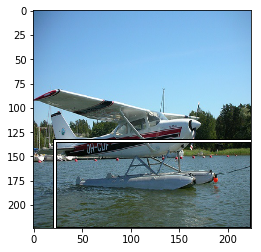

In [263]:
from scipy.special import expit,logit
i=31
ig=images[i]
pred_box=expit(ops_box.detach().cpu())*224
#pred_cords=bb_hw(pred_cords)
#print (pred_box)
b=bb_hw(box_cords[i])
print(b)
ax = show_image(np.transpose(ig,(1,2,0)), ax=ax)
draw_rect(ax,b)

In [ ]:
fig, axes = plt.subplots(8,4)
for i,ax in enumerate(axes.flat):
    ima=images[i]
    #b = categories[int(predicted[i])+1]
    pred_cords=bb_hw(ops_box[i]) #* 224
    ax = show_image(np.transpose(ima,(1,2,0)), ax=ax)
    draw_rect(ax,pred_cords)
plt.show()
plt.tight_layout()

<h2>SINGLE OBJECT DETECTION</h2>

In [ ]:
(X_train)=>(Y_train,Y_box_train)

In [ ]:
X_train.shape,Y_box_train.shape,Y_train.shape

In [168]:
df_final_train=pd.DataFrame({'fn':[val_fns[o] for o in val_ids],'target':[(val_large_anno[i][0][0],val_large_anno[i][0][1]) for i in val_ids]},
                     columns=['fn','target'])
df_final_train.to_csv('train_final.csv')

In [169]:
df_final_val=pd.DataFrame({'fn':[train_fns[o] for o in train_ids],'target':[(train_large_anno[i][0][0],train_large_anno[i][0][1]) for i in train_ids]},
                         columns=['fn','target'])
df_final_val.to_csv('val_final.csv')

In [170]:
df_final_train=pd.read_csv('train_final.csv')
df_final_train=pd.DataFrame(df_final_train,columns=['fn','target'])
df_final_train.head(5)

,fn,target
0,000001.jpg,"(array([ 11, 7, 497, 351]), 15)"
1,000002.jpg,"(array([199, 138, 300, 206]), 19)"
2,000003.jpg,"(array([154, 122, 194, 214]), 18)"
3,000004.jpg,"(array([329, 361, 388, 499]), 7)"
4,000006.jpg,"(array([208, 153, 374, 368]), 11)"


In [171]:
df_final_val=pd.read_csv('val_final.csv')
df_final_val=pd.DataFrame(df_final_val,columns=['fn','target'])
df_final_val.head(5)

,fn,target
0,000012.jpg,"(array([ 96, 155, 269, 350]), 7)"
1,000017.jpg,"(array([ 77, 89, 335, 402]), 13)"
2,000023.jpg,"(array([ 1, 2, 461, 242]), 15)"
3,000026.jpg,"(array([124, 89, 211, 336]), 7)"
4,000032.jpg,"(array([ 77, 103, 182, 374]), 1)"


In [172]:
box_final_train=[val_large_anno[i][0][0] for i in val_ids]
box_final_train=np.array(box_final_train,np.float32)
target_final_train=[val_large_anno[i][0][1] for i in val_ids]
target_final_train=np.array(target_final_train,np.float32)

In [173]:
box_final_val=[train_large_anno[i][0][0] for i in train_ids]
box_final_val=np.array(box_final_val,np.float32)
target_final_val=[train_large_anno[i][0][1] for i in train_ids]
target_final_val=np.array(target_final_val,np.float32)

In [174]:
#target_final
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(target_final_train)
onehot_encoder = OneHotEncoder(sparse=False,dtype=np.float32)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
target_encoded = onehot_encoder.fit_transform(integer_encoded)
target_encoded_train=np.array(target_encoded,np.float32)

In [175]:
#target_final
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(target_final_val)
onehot_encoder = OneHotEncoder(sparse=False,dtype=np.float32)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
target_encoded = onehot_encoder.fit_transform(integer_encoded)
target_encoded_val=np.array(target_encoded,np.float32)

In [176]:
target_encoded_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [177]:
final_target_train=np.concatenate((box_final_train,target_encoded_train),axis=1)
final_target_val=np.concatenate((box_final_val,target_encoded_val),axis=1)

In [178]:
input=final_target_train[0]
input[:4], input[4:]

(array([ 11.,   7., 497., 351.], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0., 0.], dtype=float32))

In [179]:
ip=final_target_val[0]
ip[:4],ip[4:]

(array([ 96., 155., 269., 350.], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.], dtype=float32))

In [180]:
Y_final_train=torch.from_numpy(final_target_train)
Y_final_val=torch.from_numpy(final_target_val)

In [181]:
train_data_final=utils.TensorDataset(X_train,Y_final_train)
val_data_final=utils.TensorDataset(X_val,Y_final_val)

In [182]:
train_final_loader = utils.DataLoader(train_data_final,batch_size=32,shuffle=True,num_workers=4)
test_final_loader = utils.DataLoader(val_data_final,batch_size=32,shuffle=True,num_workers=4)

In [183]:
model=models.resnet18(pretrained=True)
for param in model.parameters():
    param.require_grad=False
model_2_removed=nn.Sequential(*list(model.children())[:-2])

In [184]:
class Net(nn.Module):
    def __init__(self,model):
        super().__init__()
        self.pretrained=nn.Sequential(*list(model.children()))
        self.extra_layer=nn.Sequential(nn.Linear(512*7*7,4))
    def forward(self,x):
        x=self.pretrained(x)
        x = x.view(x.size(0), -1)
        x=self.extra_layer(x)
        return x        

In [185]:
class final_net(nn.Module):
    def __init__(self,model):
        super().__init__()
        self.pretrained=nn.Sequential(*list(model.children()))
        self.extra_layers=nn.Sequential(
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(25088,256),
        nn.ReLU(),
        nn.BatchNorm1d(256),
        nn.Dropout(0.5),
        nn.Linear(256,4+len(categories)))
        
    def forward(self,x):
        x=self.pretrained(x)
        x = x.view(x.size(0), -1)
        x=self.extra_layers(x)
        return x

In [186]:
final_model=final_net(model_2_removed)

In [187]:
final_model

final_net(
  (pretrained): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    

In [188]:
for i_batched,(img,target) in enumerate(train_final_loader):
    if i_batched == 0:
        print (final_model(img))
        #print (target)

tensor([[ 0.3691, -0.4881,  0.5495,  0.0965, -0.9892,  0.1668, -0.9698,  0.4592,
         -0.8860, -0.6007, -0.0995,  0.0806,  0.5386, -0.9435,  0.1078,  0.0196,
         -0.3104, -0.5882,  0.2735,  0.5608, -0.7941, -0.0193, -0.2068,  0.2090],
        [ 0.8383,  0.4304, -0.1055,  0.1822,  0.3718,  0.3762, -0.7818, -0.1451,
         -0.1547, -0.4892, -0.2034,  0.4358, -0.1558, -0.1067,  0.4271, -0.7454,
          0.7917, -0.2300, -0.4764,  0.9473, -0.2050,  0.6783, -0.2754,  0.3515],
        [ 0.4924, -0.5452,  0.9390, -0.1806, -0.3996, -0.2634,  0.1008,  0.1445,
         -0.1169, -0.3413,  0.2792, -0.6177,  0.0913,  0.0243, -0.1329,  0.8554,
          0.2026,  0.2999,  0.0790, -0.5363,  0.1197,  0.2115,  0.6709, -1.0615],
        [-0.2394, -0.1791, -0.4377, -0.1338, -0.4936,  0.4731,  0.3837, -0.2548,
          0.4880,  0.0853, -0.0336, -0.2593, -0.2267,  0.0931, -0.5243, -0.3555,
         -0.4821, -0.2656, -0.4027, -0.1699,  0.1769,  0.6186, -0.3834,  0.6739],
        [-0.3933, -0.290

In [189]:
criterion_class=nn.CrossEntropyLoss()
criterion_box=nn.L1Loss()

In [190]:
#LOSS FUNCTIONS
def total_loss(input,target):
    bbox,cat=target[:,:4],target[:,4:]
    pred_box,pred_cat=input[:,:4],input[:,4:]
    cat_loss=criterion_class(pred_cat,torch.max(cat,1)[1])
    pred_box=F.sigmoid(pred_box) * 224
    box_loss=criterion_box(pred_box,bbox)
    return (cat_loss*20 + box_loss)

In [191]:
optimizer = optim.Adam(final_model.cuda().parameters(),lr=1e-4)

In [192]:
final_model=final_model.cuda()

In [210]:
 test_losses=[]
for epoch in range(10):  # loop over the dataset multiple times
    ave_loss = 0
    for batch_idx, (x, target) in enumerate(train_final_loader):
        optimizer.zero_grad()
        x, target = x.cuda(), target.cuda()
        #x, target = Variable(x), Variable(target)
        out = final_model(x)
        loss=total_loss(out,target)
        ave_loss=loss.item() #* 0.1 ave_loss * 0.9 + 
        loss.backward()
        optimizer.step()
        if (batch_idx+1) % 100 == 0 or (batch_idx+1) == len(train_loader):
            print ('==>>> epoch: {}, batch index: {}, train loss: {:.6f}'.format(
                epoch, batch_idx+1, ave_loss))
    correct_cnt, ave_loss = 0, 0
    total_cnt = 0
    #test_losses=[]
    for batch_idx, (x, target) in enumerate(test_final_loader):
        x, target = x.cuda(), target.cuda()
        #x, target = Variable(x, volatile=True), Variable(target, volatile=True)
        out = final_model(x)
        loss = total_loss(out,target)
        pred_label=target
        #total_cnt += x.size()[0]
        #correct_cnt += (pred_label == target).sum()
        #acc=(correct_cnt/total_cnt) * 100
        # smooth average
        ave_loss =loss.item() #* 0.1
        #test_losses.append(ave_loss)
        if(batch_idx+1) % 100 == 0 or (batch_idx+1) == len(test_loader):
            print ('==>>> epoch: {}, batch index: {}, test loss: {:.6f}'.format(
                epoch, batch_idx+1, ave_loss))
    test_losses.append(ave_loss)

C:\Users\Srinjay\Miniconda3\envs\torch\lib\site-packages\torch\nn\functional.py:1006: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


==>>> epoch: 0, batch index: 100, train loss: 88.962509
==>>> epoch: 0, batch index: 155, train loss: 74.209450
==>>> epoch: 0, batch index: 79, test loss: 133.361725
==>>> epoch: 1, batch index: 100, train loss: 74.511879
==>>> epoch: 1, batch index: 155, train loss: 94.531036
==>>> epoch: 1, batch index: 79, test loss: 118.382095
==>>> epoch: 2, batch index: 100, train loss: 81.116440
==>>> epoch: 2, batch index: 155, train loss: 70.248985
==>>> epoch: 2, batch index: 79, test loss: 102.031189
==>>> epoch: 3, batch index: 100, train loss: 76.166710
==>>> epoch: 3, batch index: 155, train loss: 77.157524
==>>> epoch: 3, batch index: 79, test loss: 175.315918
==>>> epoch: 4, batch index: 100, train loss: 72.037071
==>>> epoch: 4, batch index: 155, train loss: 77.430443
==>>> epoch: 4, batch index: 79, test loss: 107.602737
==>>> epoch: 5, batch index: 100, train loss: 76.103348
==>>> epoch: 5, batch index: 155, train loss: 86.980919
==>>> epoch: 5, batch index: 79, test loss: 104.34057

In [202]:
dataiter = iter(test_final_loader)
images, labels = dataiter.next()
images,labels = images.cuda(), labels.cuda()

In [211]:
predictions=final_model(images)
predictions[0]

tensor([ 0.3787, -3.5723,  6.8537,  5.2254, -1.2640, -0.3276, -1.5075, -2.2880,
        -1.6876, -0.7351,  2.8564,  0.0755, -1.9566, -0.2258, -0.8986, -2.1939,
         0.2254,  2.5297,  0.8747, -0.9695, -3.7314,  0.3298,  8.5497, -1.2829],
       device='cuda:0', grad_fn=<SelectBackward>)

tensor([0.3827, 0.1197, 6.3336, 6.4834], device='cuda:0', grad_fn=<SliceBackward>)
tensor([133.1714, 118.6980, 223.6030, 223.6581])
car


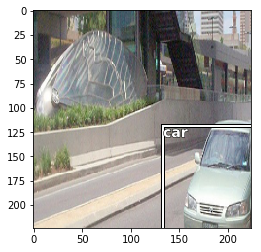

In [221]:
from scipy.special import expit
i=31
ima=images[i].cpu().numpy()
#plt.imshow(np.transpose(images[i].cpu().numpy(),(1,2,0)))
ax = show_image(np.transpose(ima,(1,2,0)), ax=ax)
p_preds=predictions[i]
pred_box=p_preds[:4]
print (pred_box)
pred_box=expit(pred_box.detach().cpu())*224
print (pred_box)
class_values=p_preds[4:]
class_values=class_values.detach().cpu()
#print (class_values)
print (categories[np.argmax(class_values.numpy())+1])
b=bb_hw(pred_box)
draw_rect(ax, pred_box)
draw_text(ax, pred_box[:2],categories[np.argmax(class_values.numpy())+1])

NameError: name 'predictions' is not defined

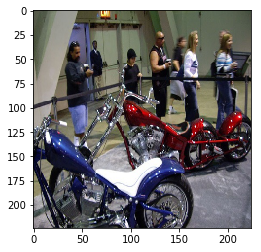

In [260]:
from scipy.special import expit
i=3
ima=images[i].cpu().numpy()
#plt.imshow(np.transpose(images[i].cpu().numpy(),(1,2,0)))
ax = show_image(np.transpose(ima,(1,2,0)), ax=ax)
p_preds=predictions[i]
pred_box=p_preds[:4]
print (pred_box)
pred_box=expit(pred_box.detach().cpu())*224
print (pred_box)
class_values=p_preds[4:]
class_values=class_values.detach().cpu()
#print (class_values)
print (categories[np.argmax(class_values.numpy())+1])
b=bb_hw(pred_box)
draw_rect(ax, pred_box)
draw_text(ax, pred_box[:2],categories[np.argmax(class_values.numpy())+1])